1- Do all stores have all kinds of family products?

\begin{equation}
    \forall p \in \mathcal{P}, G(p) = \{s \mid \forall s \in \mathcal{S}, \text{prod}(s) = \mathcal{P}\}
\end{equation}

In [212]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
import seaborn as sns
from scipy import signal

In [213]:
train_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/train.csv')

In [214]:
train_cpy = train_df

In [215]:
train_df['date'] = pd.to_datetime(train_df['date'], format= "%Y-%m-%d")

In [216]:
train_cpy.head(15)

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.0,0
6,6,2013-01-01,1,CELEBRATION,0.0,0
7,7,2013-01-01,1,CLEANING,0.0,0
8,8,2013-01-01,1,DAIRY,0.0,0
9,9,2013-01-01,1,DELI,0.0,0


1- Do all stores have all kinds of family products?

\begin{equation}
    \forall p \in \mathcal{P}, G(p) = \{s \mid \forall s \in \mathcal{S}, \text{prod}(s) = \mathcal{P}\}
\end{equation}

In [217]:
grouped = train_df.groupby('store_nbr')['family'].apply(set)

In [218]:
grouped.head()

store_nbr
1    {HOME AND KITCHEN I, BEAUTY, CLEANING, EGGS, M...
2    {HOME AND KITCHEN I, BEAUTY, CLEANING, EGGS, M...
3    {HOME AND KITCHEN I, BEAUTY, CLEANING, EGGS, M...
4    {HOME AND KITCHEN I, BEAUTY, CLEANING, EGGS, M...
5    {HOME AND KITCHEN I, BEAUTY, CLEANING, EGGS, M...
Name: family, dtype: object

In [219]:
products_availability = all(set(train_df['family']).issubset(product) for product in grouped)

if products_availability:
    print("All stores have all kinds of family products.")
else:
    print("Not all stores have all kinds of family products.")

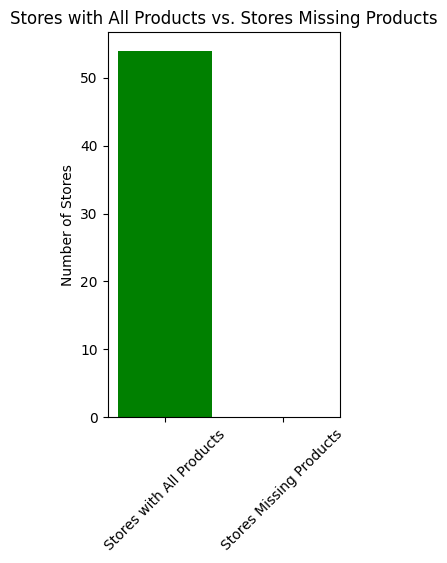

Percentage of stores that have data for all product families: 100.00%


In [220]:
store_product_count = train_df.groupby('store_nbr')['family'].nunique() 

complete_stores_count = sum(store_product_count == train_df['family'].nunique()) 

plt.figure(figsize=(3, 5))
plt.bar(['Stores with All Products', 'Stores Missing Products'], 
        [complete_stores_count, len(store_product_count) - complete_stores_count], 
        color=['green', 'red'])
plt.ylabel('Number of Stores')
plt.title('Stores with All Products vs. Stores Missing Products')
plt.xticks(rotation=45)
plt.show()

# Calculate the percentage of stores with all family products
percentage = (complete_stores_count / len(store_product_count)) * 100

print(f"Percentage of stores that have data for all product families: {percentage:.2f}%")


This implies a widespread and consistent distribution of products across all stores, ensuring that customers can probably find a similar range of goods, no matter where they are. This consistency can lead to more predictable stock management and varied product offerings across different areas, meeting diverse customer preferences and needs, and ultimately leading to a standardized and all-encompassing shopping experience.

In [221]:
column_names_list = train_df.columns.tolist()
print(column_names_list)

['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion']


2- Average sales of all stores:

Total average sale of each store:
        \begin{equation}
            Avg_{total} = \frac{1}{{m \times \mathcal{T}}} \sum_{p \in \text{prod}(s)}\sum_{t=0}^ \mathcal{T} X_{t}^{sp}
        \end{equation}

The average sales for each day over time:    
        \begin{equation}
            Avg_{t} = \frac{1}{n \times m} \sum_{s \in \mathcal{S}}\sum_{p \in \text{prod}(s)} X_{t}^{sp}
        \end{equation}
The average of sales for each store for each time step over all families of products then the average for each time step over all those averages.
        \begin{equation}
            Avg_{t} = \frac{1}{n}\sum_{s=1}^{S}\left( \frac{1}{m}\sum_{p \in \text{prod}(s)} X_{t}^{sp} \right) 
        \end{equation}



#### Average sales of all stores:

In [222]:
avg_per_stores = train_df.groupby('store_nbr')['sales'].mean()

In [223]:
avg_per_stores_sort = avg_per_stores.sort_values()

In [224]:
first_non_zero = train_df.groupby('store_nbr')['sales'].idxmax()

agg_sales_start_non_zero = train_df.loc[first_non_zero]
avg_per_stores_non_zero = agg_sales_start_non_zero.groupby('store_nbr')['sales'].mean()

avg_per_stores_non_zero_sort = avg_per_stores_non_zero.sort_values()

Average sale per stores (non-zero start):



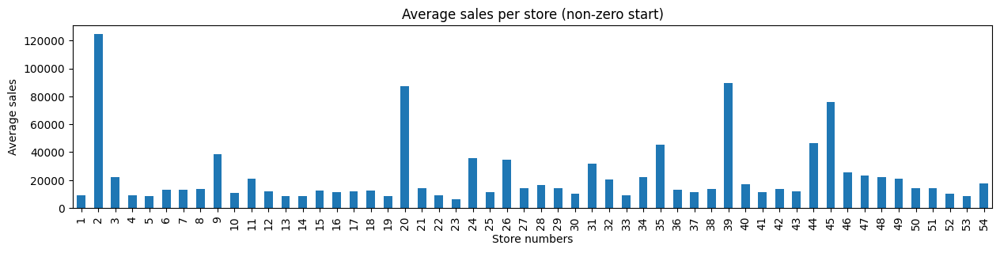



Sorted average sale per stores (non-zero start):



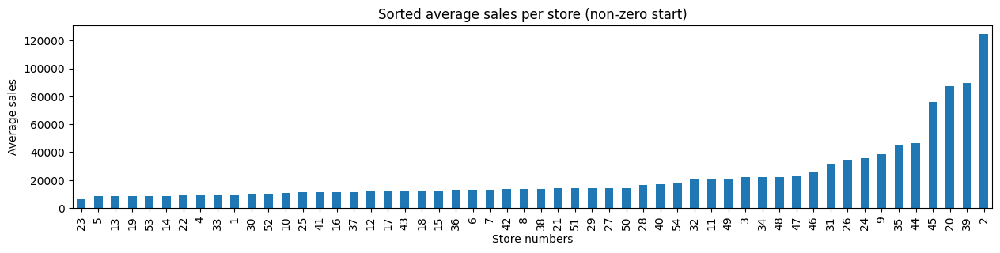

In [225]:
plt.figure(figsize=(15, 3))
print('Average sale per stores (non-zero start):\n')
avg_per_stores_non_zero.plot(kind='bar')
plt.xlabel('Store numbers')
plt.ylabel('Average sales')
plt.title('Average sales per store (non-zero start)')
plt.show()
print('\n')

print('Sorted average sale per stores (non-zero start):\n')
plt.figure(figsize=(15, 3))
avg_per_stores_non_zero_sort.plot(kind='bar')
plt.xlabel('Store numbers')
plt.ylabel('Average sales')
plt.title('Sorted average sales per store (non-zero start)')
plt.show()

#### The average sales for each day over time:

In [226]:
train_df

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [227]:
train_df['mean_sales'] = train_df.groupby('date')['sales'].transform('mean')

In [228]:
train_df

,id,date,store_nbr,family,sales,onpromotion,mean_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1.409438
1,1,2013-01-01,1,BABY CARE,0.000,0,1.409438
2,2,2013-01-01,1,BEAUTY,0.000,0,1.409438
3,3,2013-01-01,1,BEVERAGES,0.000,0,1.409438
4,4,2013-01-01,1,BOOKS,0.000,0,1.409438
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,427.980884
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,427.980884
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,427.980884
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,427.980884


average per date:  



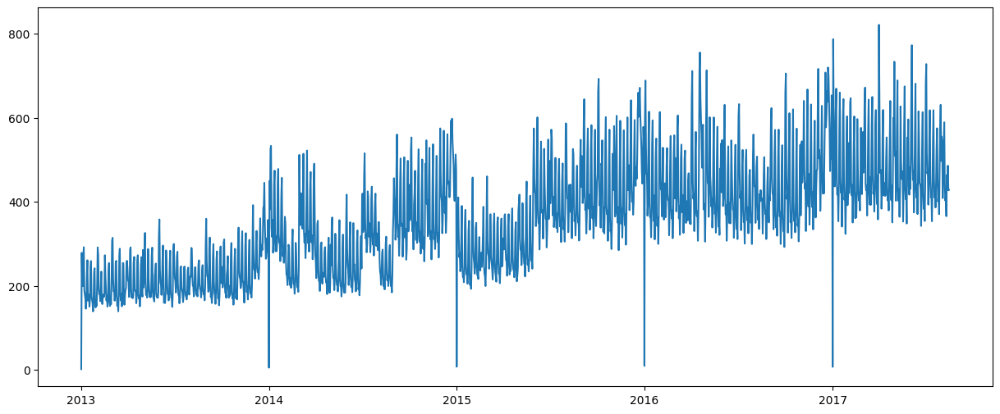

In [229]:
plt.figure(figsize=(15,6))
print('average per date: ', '\n')
tm_df = train_df[['date', 'mean_sales']].drop_duplicates()
plt.plot(tm_df['date'], tm_df['mean_sales'])
plt.show()

In [230]:
first_non_zero_index = train_df.groupby('store_nbr')['sales'].transform(lambda x: (x.shift(1) == 0) & (x != 0))
modified_sales = train_df[~first_non_zero_index]

In [231]:
modified_sales

,id,date,store_nbr,family,sales,onpromotion,mean_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1.409438
1,1,2013-01-01,1,BABY CARE,0.000,0,1.409438
2,2,2013-01-01,1,BEAUTY,0.000,0,1.409438
3,3,2013-01-01,1,BEVERAGES,0.000,0,1.409438
4,4,2013-01-01,1,BOOKS,0.000,0,1.409438
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,427.980884
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,427.980884
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,427.980884
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,427.980884


In [232]:
modified_sales.loc[:, 'mean_sales'] = modified_sales.groupby('date')['sales'].transform('mean')

In [233]:
modified_sales

,id,date,store_nbr,family,sales,onpromotion,mean_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1.119140
1,1,2013-01-01,1,BABY CARE,0.000,0,1.119140
2,2,2013-01-01,1,BEAUTY,0.000,0,1.119140
3,3,2013-01-01,1,BEVERAGES,0.000,0,1.119140
4,4,2013-01-01,1,BOOKS,0.000,0,1.119140
...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,453.104914
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,453.104914
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,453.104914
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,453.104914


average per date with removing the values before opening:  



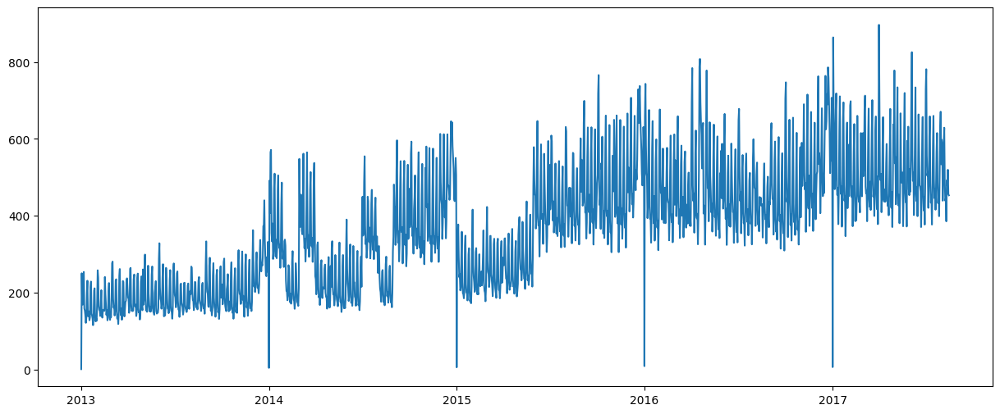

In [234]:
plt.figure(figsize=(15,6))
print('average per date with removing the values before opening: ', '\n')
tm_df = modified_sales[['date', 'mean_sales']].drop_duplicates()
plt.plot(modified_sales['date'], modified_sales['mean_sales'])
plt.show()

#### The average of sales for each store for each time step over all families of products then the average for each time step over all those averages. 

In [235]:
train_df['date'] = pd.to_datetime(train_df['date'], format= "%Y-%m-%d")

In [236]:
train_df['agg_sales'] = train_df[['date', 'store_nbr', 'sales']].groupby(['date', 'store_nbr']).transform('sum')

In [237]:
stores= train_df['store_nbr'].drop_duplicates().values

store_number: 1


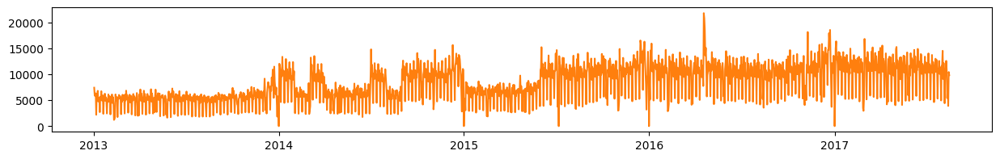

store_number: 10


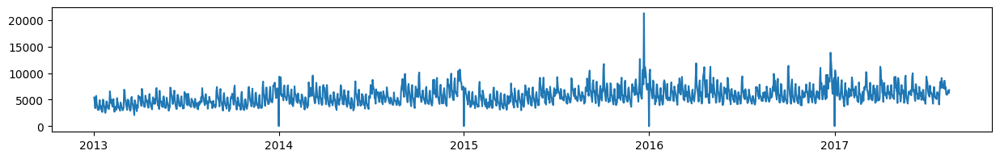

store_number: 11


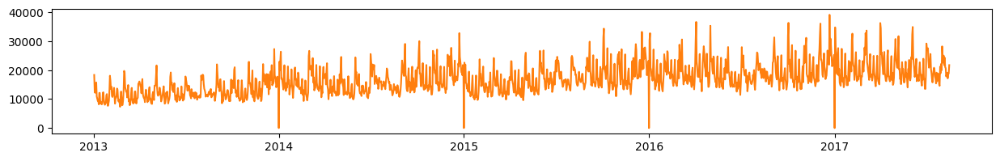

store_number: 12


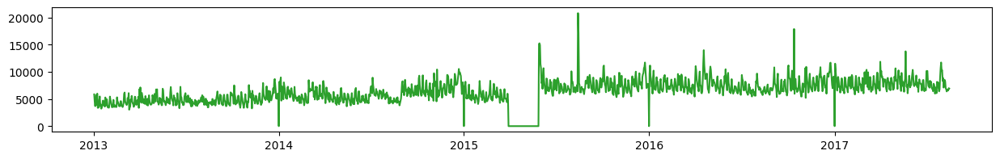

store_number: 13


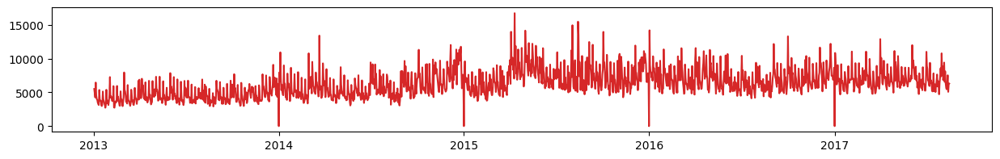

store_number: 14


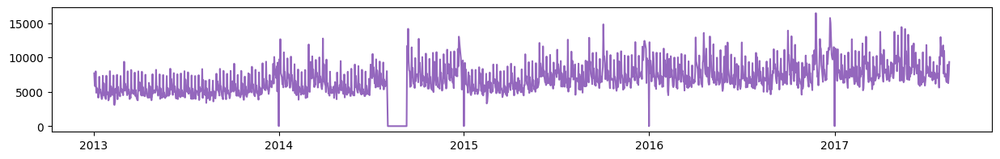

store_number: 15


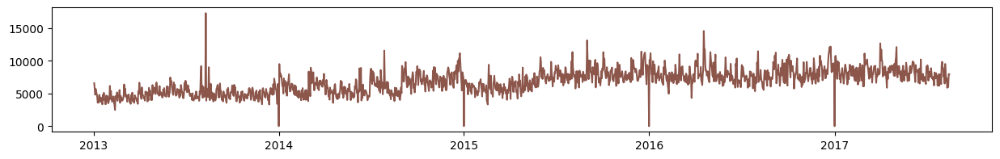

store_number: 16


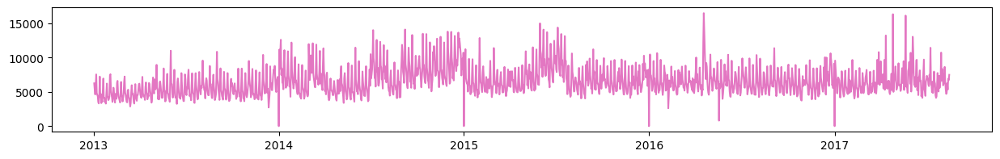

store_number: 17


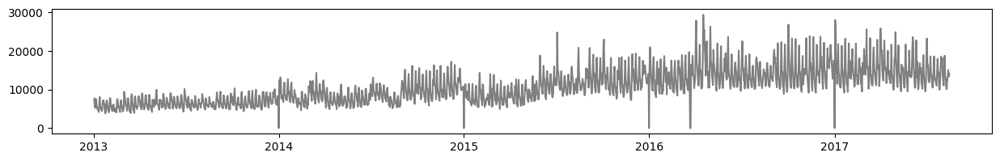

store_number: 18


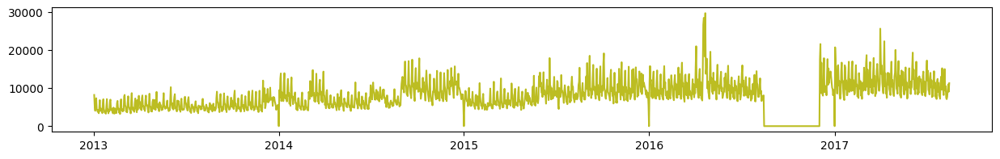

store_number: 19


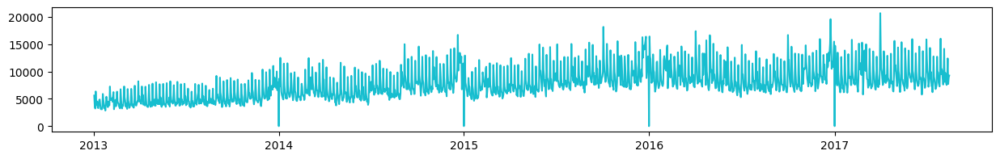

store_number: 2


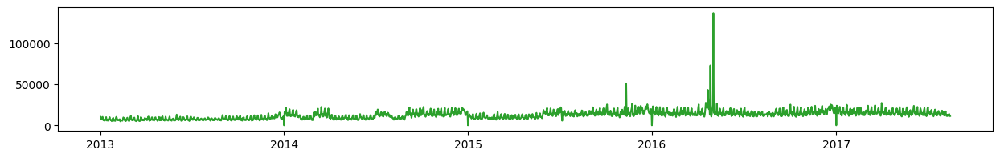

store_number: 20


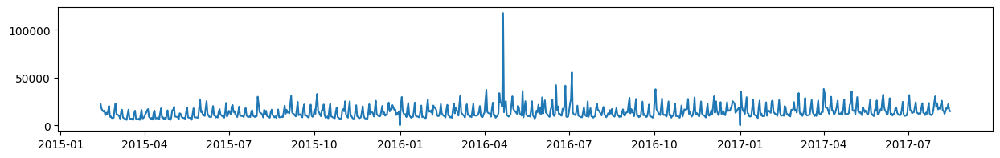

store_number: 21


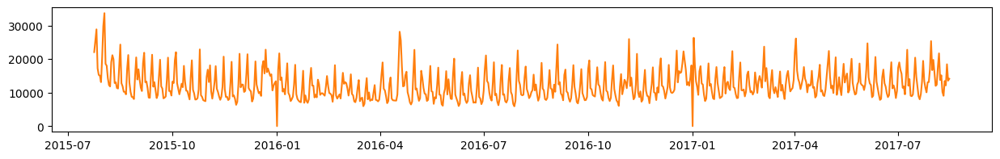

store_number: 22


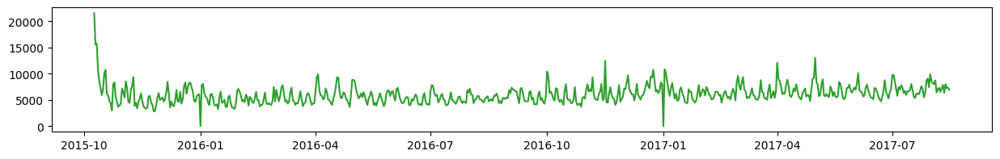

store_number: 23


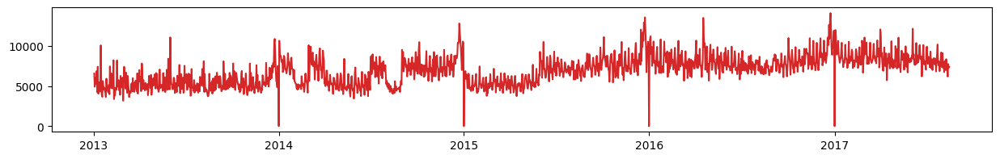

store_number: 24


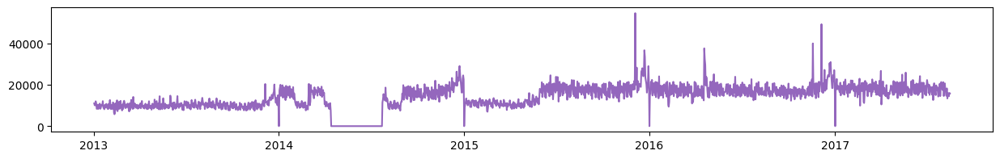

store_number: 25


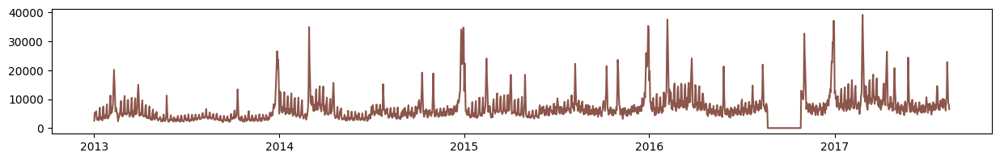

store_number: 26


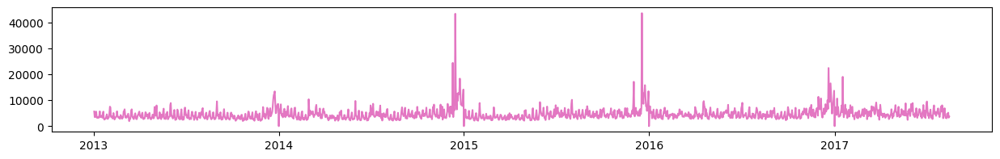

store_number: 27


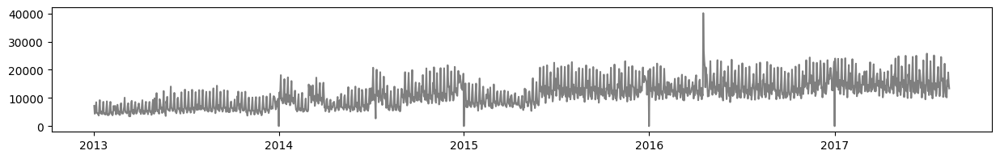

store_number: 28


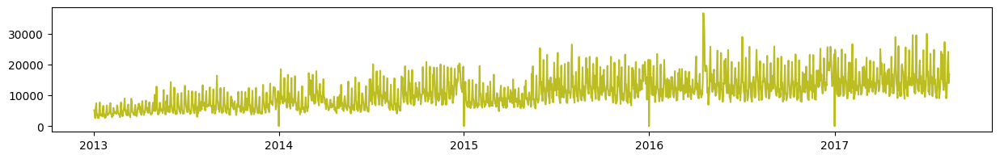

store_number: 29


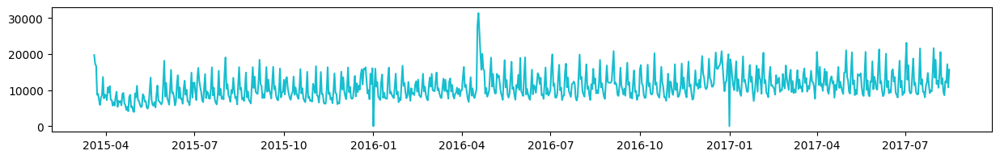

store_number: 3


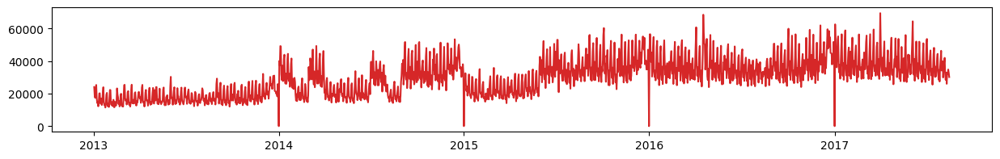

store_number: 30


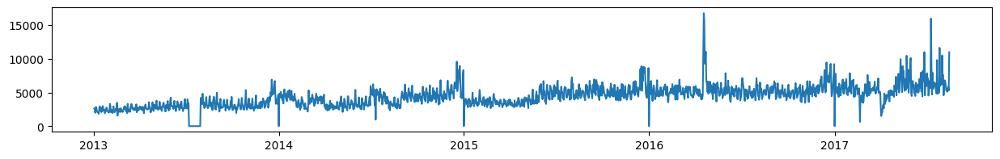

store_number: 31


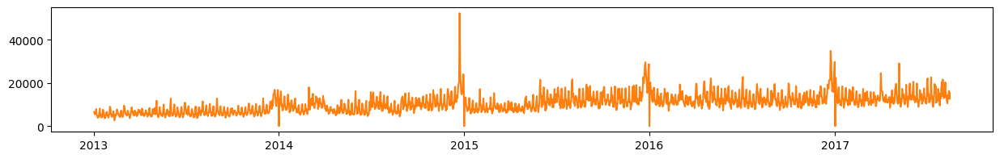

store_number: 32


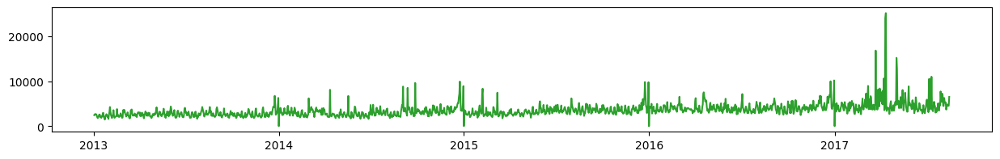

store_number: 33


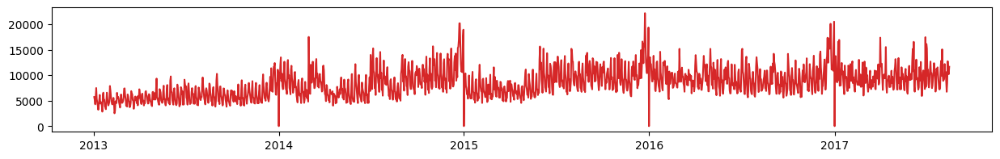

store_number: 34


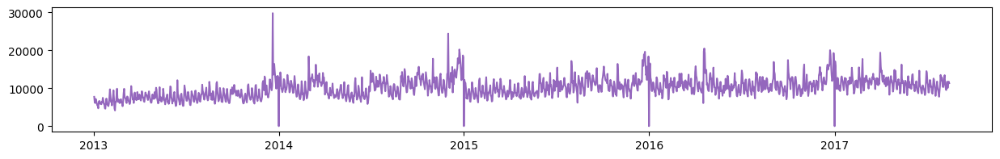

store_number: 35


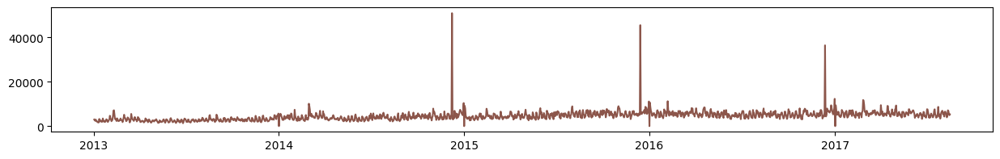

store_number: 36


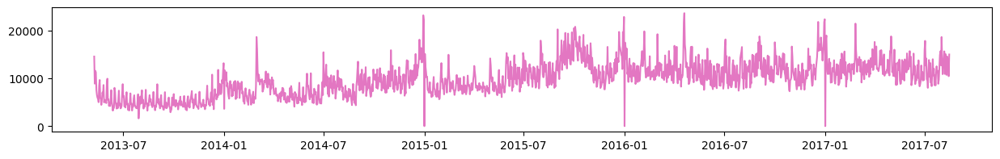

store_number: 37


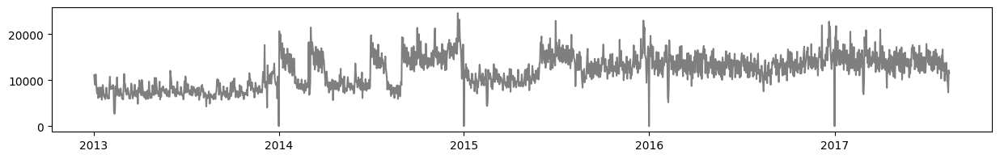

store_number: 38


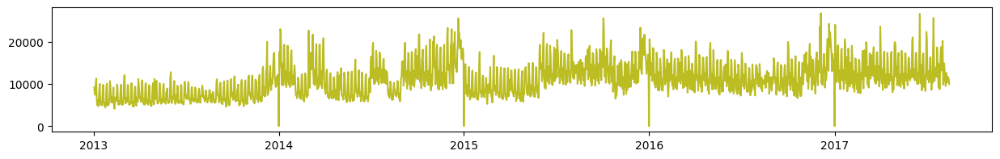

store_number: 39


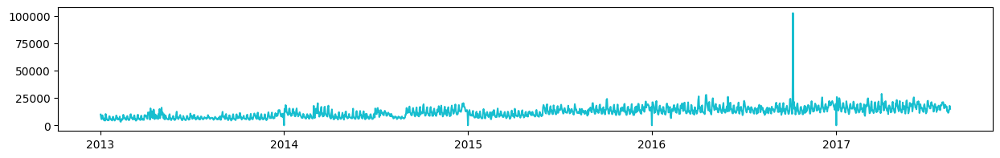

store_number: 4


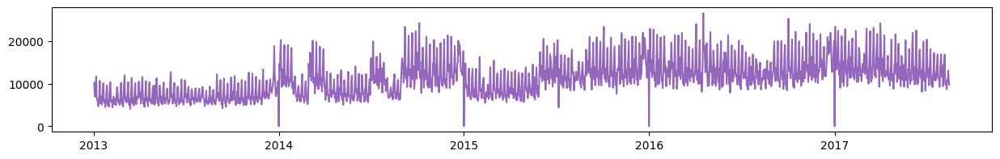

store_number: 40


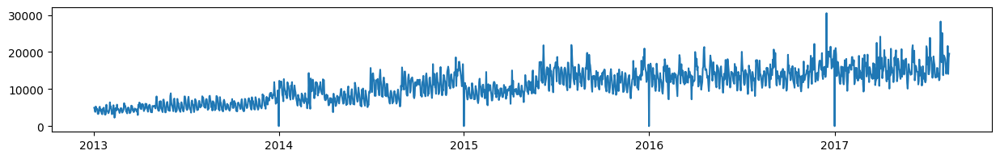

store_number: 41


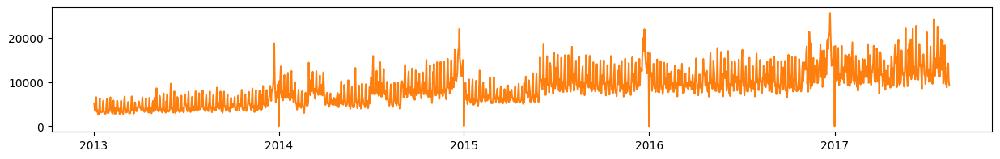

store_number: 42


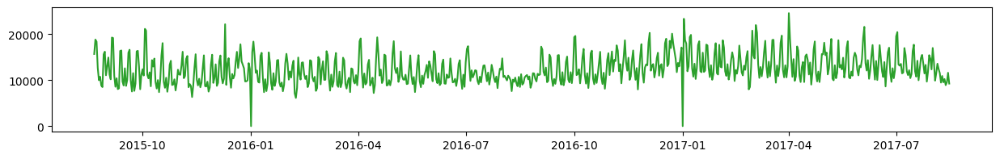

store_number: 43


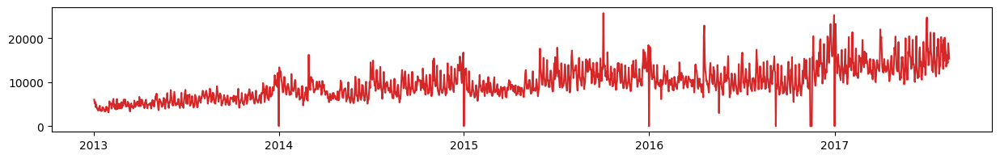

store_number: 44


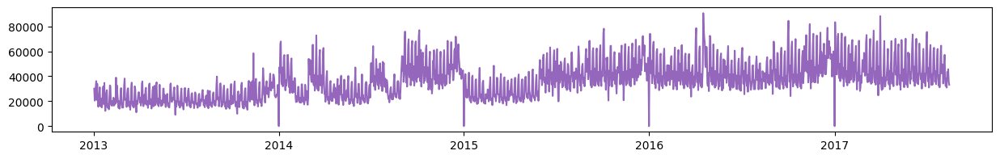

store_number: 45


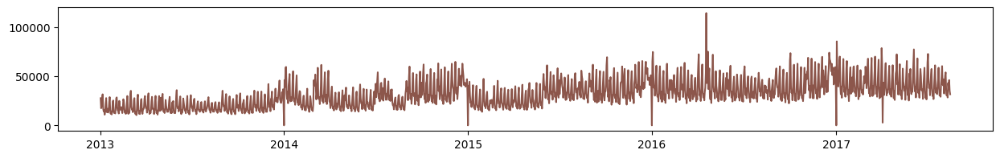

store_number: 46


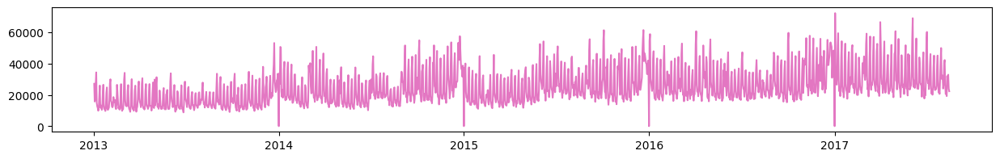

store_number: 47


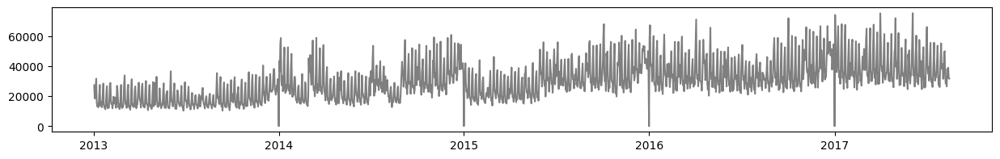

store_number: 48


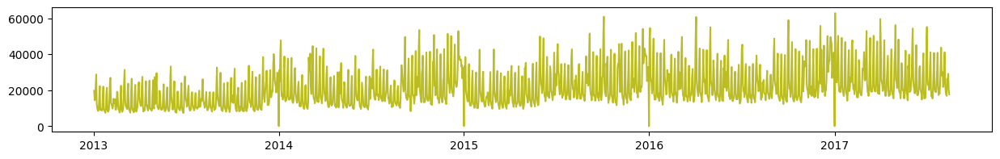

store_number: 49


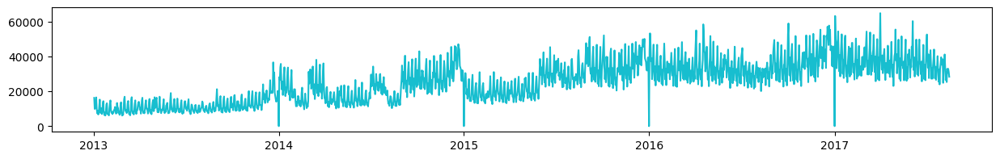

store_number: 5


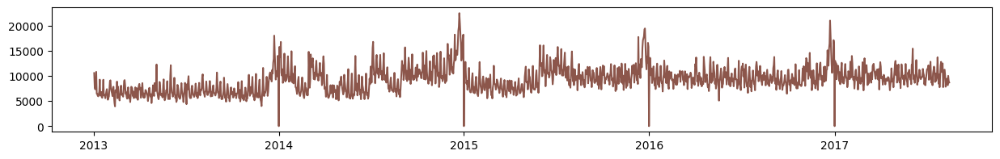

store_number: 50


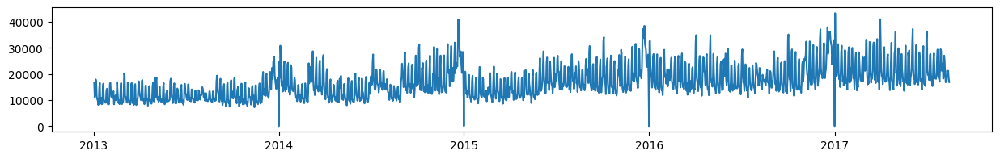

store_number: 51


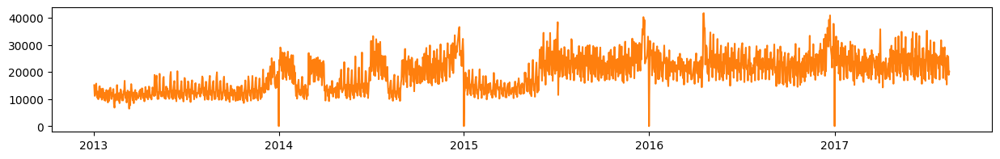

store_number: 52


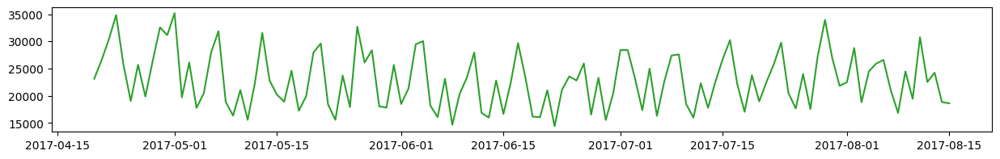

store_number: 53


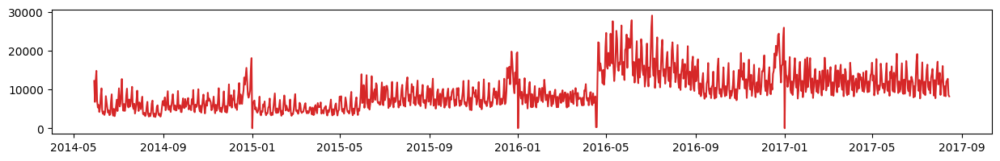

store_number: 54


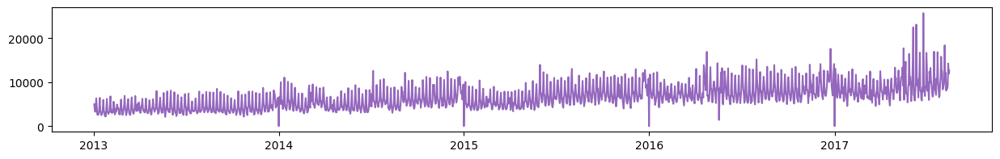

store_number: 6


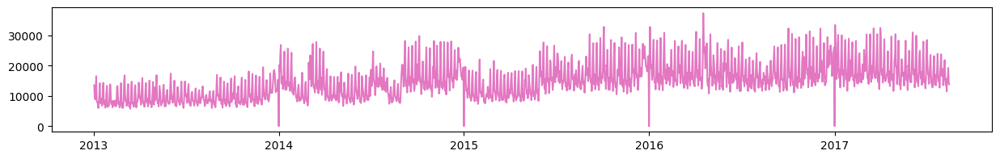

store_number: 7


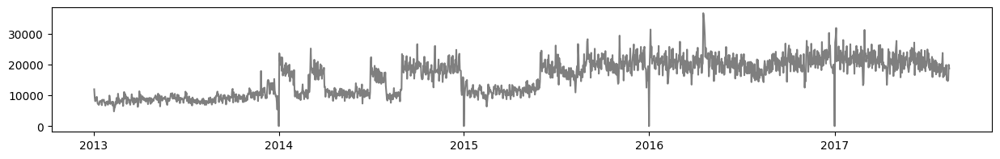

store_number: 8


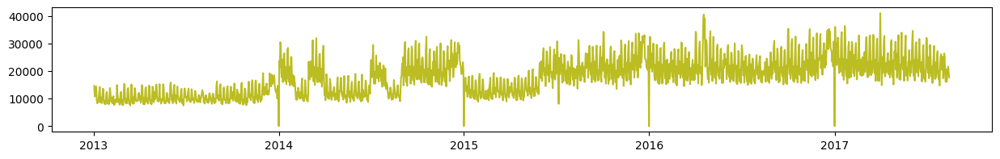

store_number: 9


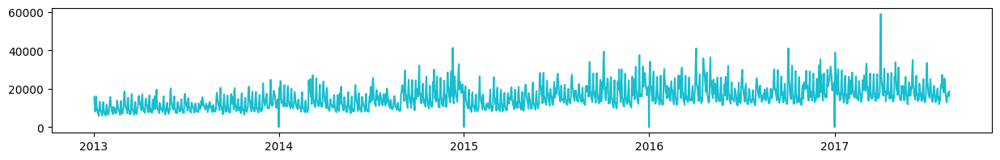

In [238]:
for store in stores:
    tmp_df = train_df[train_df['store_nbr'] == store][['date', 'agg_sales']].drop_duplicates()
    mask = tmp_df['agg_sales'] != 0
    first_non_zero_index = mask.idxmax()
    tmp_df = tmp_df.loc[first_non_zero_index:]

    print('store_number:', store)
    plt.figure(figsize=(15, 2))
    plt.plot(tmp_df['date'], tmp_df['agg_sales'], 'C' + str(store))
    plt.show()

In [239]:
train_df.head(20)

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,1.409438,0.0
1,1,2013-01-01,1,BABY CARE,0.0,0,1.409438,0.0
2,2,2013-01-01,1,BEAUTY,0.0,0,1.409438,0.0
3,3,2013-01-01,1,BEVERAGES,0.0,0,1.409438,0.0
4,4,2013-01-01,1,BOOKS,0.0,0,1.409438,0.0
5,5,2013-01-01,1,BREAD/BAKERY,0.0,0,1.409438,0.0
6,6,2013-01-01,1,CELEBRATION,0.0,0,1.409438,0.0
7,7,2013-01-01,1,CLEANING,0.0,0,1.409438,0.0
8,8,2013-01-01,1,DAIRY,0.0,0,1.409438,0.0
9,9,2013-01-01,1,DELI,0.0,0,1.409438,0.0


In [240]:
average_agg_sales_per_store_per_time_step = train_df.groupby(['date', 'store_nbr'])['agg_sales'].mean().reset_index()

In [241]:
filtered_store_data = [] 


for store in average_agg_sales_per_store_per_time_step['store_nbr'].unique():
    tmp_df = average_agg_sales_per_store_per_time_step[average_agg_sales_per_store_per_time_step['store_nbr'] == store].copy()
    first_non_zero_index = tmp_df[tmp_df['agg_sales'] != 0]['date'].idxmin() 
    tmp_df = tmp_df.loc[first_non_zero_index:]

    filtered_store_data.append(tmp_df)

In [242]:
filtered_average_agg_sales_per_store_per_time_step = pd.concat(filtered_store_data) 

In [243]:
average_of_average_agg_sales_per_time_step = filtered_average_agg_sales_per_store_per_time_step.groupby('date')['agg_sales'].mean()

In [244]:
average_of_average_agg_sales_per_time_step = average_of_average_agg_sales_per_time_step.reset_index()

In [245]:
average_of_average_agg_sales_per_time_step['agg_sales']

0        2511.618999
1       10784.617781
2        7857.852851
3        7705.645154
4       10377.176548
            ...     
1679    15303.217074
1680    14678.343242
1681    16030.364398
1682    14091.155668
1683    14123.369184
Name: agg_sales, Length: 1684, dtype: float64

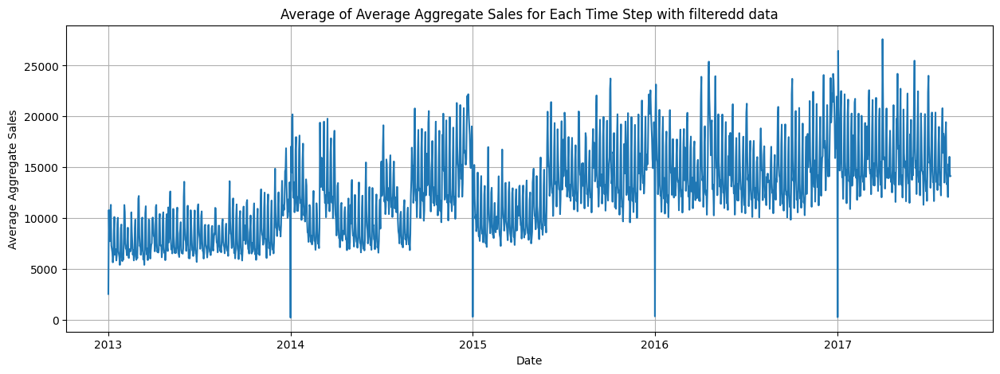

In [246]:
plt.figure(figsize=(15, 5))
plt.plot(average_of_average_agg_sales_per_time_step['date'],average_of_average_agg_sales_per_time_step['agg_sales'])
plt.title('Average of Average Aggregate Sales for Each Time Step with filteredd data')
plt.xlabel('Date')
plt.ylabel('Average Aggregate Sales')
plt.grid(True)
plt.show()

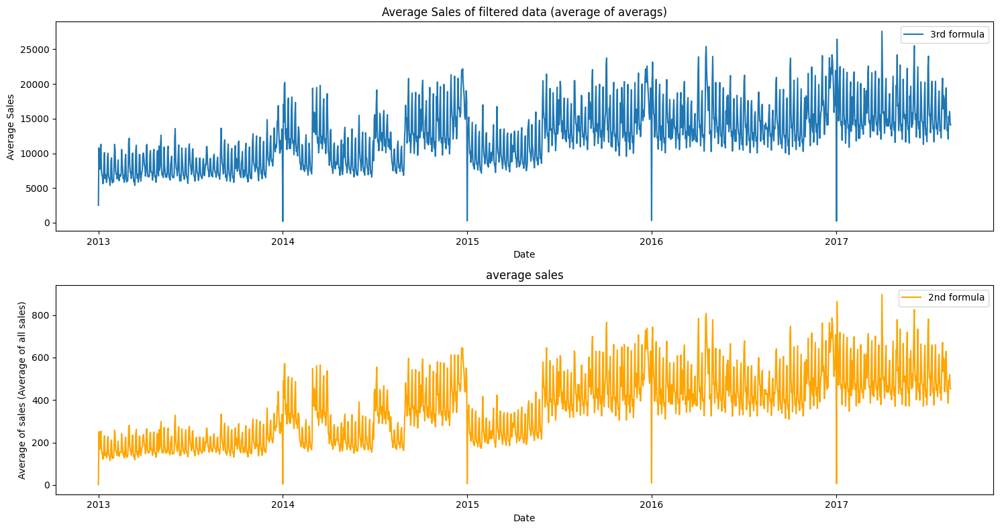

In [247]:
plt.figure(figsize=(15, 8))


plt.subplot(2, 1, 1)
plt.plot(average_of_average_agg_sales_per_time_step['date'],average_of_average_agg_sales_per_time_step['agg_sales'], label='3rd formula')
plt.title('Average Sales of filtered data (average of averags)')
plt.xlabel('Date')
plt.ylabel('Average Sales')
plt.legend()


plt.subplot(2, 1, 2)
plt.plot(modified_sales['date'], modified_sales['mean_sales'], label='2nd formula', color='orange')
plt.title('average sales')
plt.xlabel('Date')
plt.ylabel('Average of sales (Average of all sales)')
plt.legend()

plt.tight_layout()
plt.show()

### Average sales for each week day

In [248]:
avg_per_stores = train_df.groupby('store_nbr')['sales'].mean()
avg_per_stores_sort = avg_per_stores.sort_values()

In [249]:
daily_avg_sales = train_df.groupby([train_df['date'].dt.day_name()])['sales'].mean()

Average sale per specific day of the week: 
 date
Friday       325.238138
Monday       346.544732
Saturday     433.336472
Sunday       463.085366
Thursday     283.540517
Tuesday      319.823843
Wednesday    332.909401
Name: sales, dtype: float64


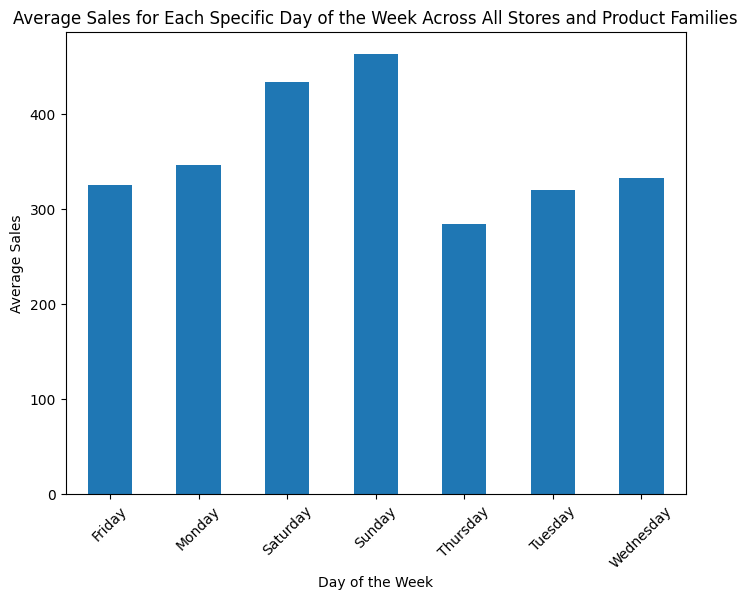

In [250]:
plt.figure(figsize=(8, 6))
daily_avg_sales_sorted = daily_avg_sales.sort_index()
print('Average sale per specific day of the week:', '\n', daily_avg_sales_sorted)
daily_avg_sales_sorted.plot(kind='bar')
plt.title('Average Sales for Each Specific Day of the Week Across All Stores and Product Families')
plt.xlabel('Day of the Week')
plt.ylabel('Average Sales')
plt.xticks(rotation=45)
plt.show()

3- Do all the stores have all data points from the beginning to the end of the dataset over time?

\begin{equation}
    F(s,p) = \{t \mid t \in \mathcal{T}, X_{t}^{sp} \neq 0\}
\end{equation}

In [251]:
date_range = pd.date_range(train_df['date'].min(), train_df['date'].max())

In [252]:
complete = True

for store in train_df['store_nbr'].unique():
    for product in train_df['family'].unique():

        dates = train_df[(train_df['store_nbr'] == store) & (train_df['family'] == product)]['date']
        if not date_range.isin(dates).all():
            complete = False
            break  
    if not complete:
        break

In [253]:
print(f"All stores and products have data for each date in the dataset? {'Yes' if complete else 'No'}")

All stores and products have data for each date in the dataset? No


This absence of data for certain stores or products on particular dates suggests that the dataset is not fully populated and may have gaps in the recorded sales information.

4-The look at the oil price time series and compare it with the sales time series.

and

7- Checking the behavior of 2014 to 2015 related to the oil price, is it region-dependent or city-dependent?

In [254]:
oil_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/oil.csv')

In [255]:
oil_df

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [256]:
oil_df['dcoilwtico'] = oil_df['dcoilwtico'].fillna(0)

In [257]:
oil_df

,date,dcoilwtico
0,2013-01-01,0.00
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20
...,...,...
1213,2017-08-25,47.65
1214,2017-08-28,46.40
1215,2017-08-29,46.46
1216,2017-08-30,45.96


In [258]:
oil_df['date'] = pd.to_datetime(oil_df['date'], format= "%Y-%m-%d")

Price of oil in Ecuadour:  



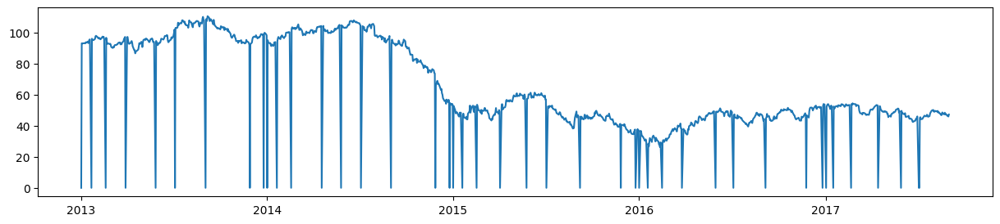

In [259]:
print('Price of oil in Ecuadour: ','\n')
plt.figure(figsize=(15,3))
plt.plot(oil_df['date'], oil_df['dcoilwtico'])
plt.show()

In [260]:
zero_price_dates = oil_df[oil_df['dcoilwtico'] == 0]['date']
print('Dates with oil price value of 0:')
print(zero_price_dates)

Dates with oil price value of 0:
0      2013-01-01
14     2013-01-21
34     2013-02-18
63     2013-03-29
104    2013-05-27
132    2013-07-04
174    2013-09-02
237    2013-11-28
256    2013-12-25
261    2014-01-01
274    2014-01-20
294    2014-02-17
338    2014-04-18
364    2014-05-26
393    2014-07-04
434    2014-09-01
497    2014-11-27
517    2014-12-25
522    2015-01-01
534    2015-01-19
554    2015-02-16
588    2015-04-03
624    2015-05-25
653    2015-07-03
699    2015-09-07
757    2015-11-26
778    2015-12-25
783    2016-01-01
794    2016-01-18
814    2016-02-15
843    2016-03-25
889    2016-05-30
914    2016-07-04
959    2016-09-05
1017   2016-11-24
1039   2016-12-26
1044   2017-01-02
1054   2017-01-16
1079   2017-02-20
1118   2017-04-14
1149   2017-05-29
1174   2017-07-03
1175   2017-07-04
Name: date, dtype: datetime64[ns]


In [261]:
zero_price_count_by_year = oil_df[oil_df['dcoilwtico'] == 0].groupby(oil_df['date'].dt.year)['date'].count()
print('\nNumber of 0 values in each year:')
print(zero_price_count_by_year)


Number of 0 values in each year:
date
2013    9
2014    9
2015    9
2016    9
2017    7
Name: date, dtype: int64


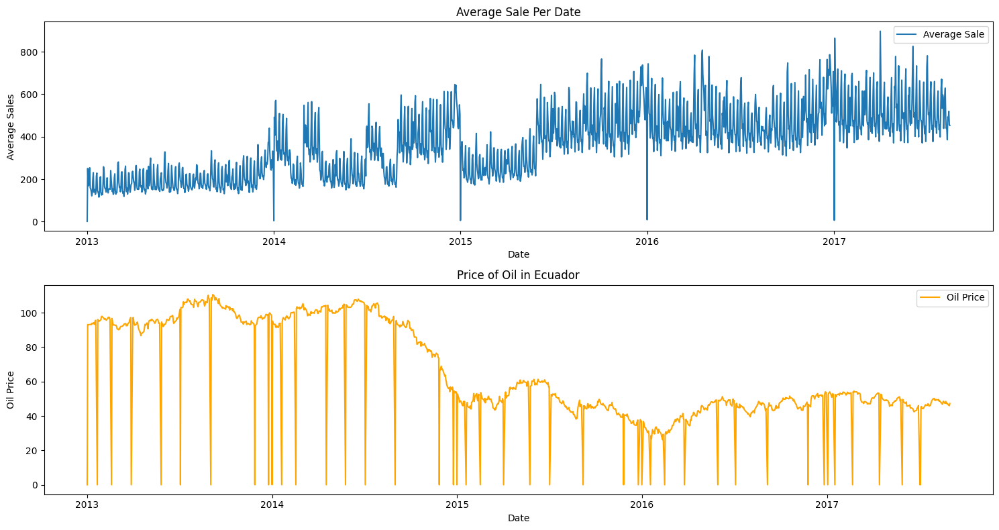

In [262]:
plt.figure(figsize=(15, 8))


plt.subplot(2, 1, 1)
plt.plot(tm_df['date'], tm_df['mean_sales'], label='Average Sale')
plt.title('Average Sale Per Date')
plt.xlabel('Date')
plt.ylabel('Average Sales')
plt.legend()


plt.subplot(2, 1, 2)
plt.plot(oil_df['date'], oil_df['dcoilwtico'], label='Oil Price', color='orange')
plt.title('Price of Oil in Ecuador')
plt.xlabel('Date')
plt.ylabel('Oil Price')
plt.legend()

plt.tight_layout()
plt.show()

Some of these dates correspond to public holidays such as New Year's Day (January 1), Independence of Quito (January 21), Carnival (February 18-19), International Workers' Day (May 1), and Christmas Day (December 25).

In [263]:
def yearly_correlation(data):
    yearly_correlation = data.groupby([data['date'].dt.year, 'store_nbr']) \
                             .apply(lambda x: x['agg_sales'].corr(x['dcoilwtico']))
    return yearly_correlation

In [264]:
train_df['agg_sales'] = train_df.groupby(['date', 'store_nbr'])['sales'].transform('sum')

In [265]:
merged_df = train_df.merge(oil_df, on='date', how='inner')

In [266]:
merged_df

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,dcoilwtico
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1.409438,0.000,0.00
1,1,2013-01-01,1,BABY CARE,0.000,0,1.409438,0.000,0.00
2,2,2013-01-01,1,BEAUTY,0.000,0,1.409438,0.000,0.00
3,3,2013-01-01,1,BEVERAGES,0.000,0,1.409438,0.000,0.00
4,4,2013-01-01,1,BOOKS,0.000,0,1.409438,0.000,0.00
...,...,...,...,...,...,...,...,...,...
2143741,3000883,2017-08-15,9,POULTRY,438.133,0,427.980884,18636.477,47.57
2143742,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,427.980884,18636.477,47.57
2143743,3000885,2017-08-15,9,PRODUCE,2419.729,148,427.980884,18636.477,47.57
2143744,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,427.980884,18636.477,47.57


In [267]:
yearly_corr = yearly_correlation(merged_df)

/home/nnemati/python_envs/sales_env/lib/python3.10/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/nnemati/python_envs/sales_env/lib/python3.10/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/tmp/ipykernel_11543/3729583578.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x['agg_sales'].corr(x['dcoilwtico']))


In [268]:
print(yearly_corr)

date  store_nbr
2013  1            0.208085
      2            0.150672
      3            0.111615
      4            0.099332
      5            0.084590
                     ...   
2017  50          -0.254688
      51          -0.003277
      52          -0.136457
      53          -0.099961
      54          -0.159993
Length: 270, dtype: float64


In [269]:
for year in yearly_corr.index.levels[0]:
    print(f"Data for year {year}:")
    year_data = yearly_corr.loc[year]
    print(year_data)

Data for year 2013:
store_nbr
1     0.208085
2     0.150672
3     0.111615
4     0.099332
5     0.084590
6     0.079385
7     0.100339
8     0.144487
9     0.054447
10    0.104690
11    0.122525
12    0.081085
13    0.079021
14    0.048991
15    0.113932
16    0.103043
17    0.079830
18    0.084621
19    0.129548
20         NaN
21         NaN
22         NaN
23    0.150518
24    0.194269
25   -0.044041
26    0.047587
27    0.183336
28    0.139499
29         NaN
30   -0.001509
31    0.074429
32    0.066702
33    0.084222
34    0.131126
35    0.054505
36    0.171435
37    0.106132
38    0.103634
39    0.064481
40    0.128398
41    0.060610
42         NaN
43    0.106377
44    0.077329
45    0.064975
46    0.047038
47    0.049804
48    0.038033
49    0.068024
50    0.081446
51    0.162386
52         NaN
53         NaN
54    0.086731
dtype: float64
Data for year 2014:
store_nbr
1    -0.228760
2    -0.314173
3    -0.311183
4    -0.289436
5    -0.363329
6    -0.291033
7    -0.276653
8    -0.29

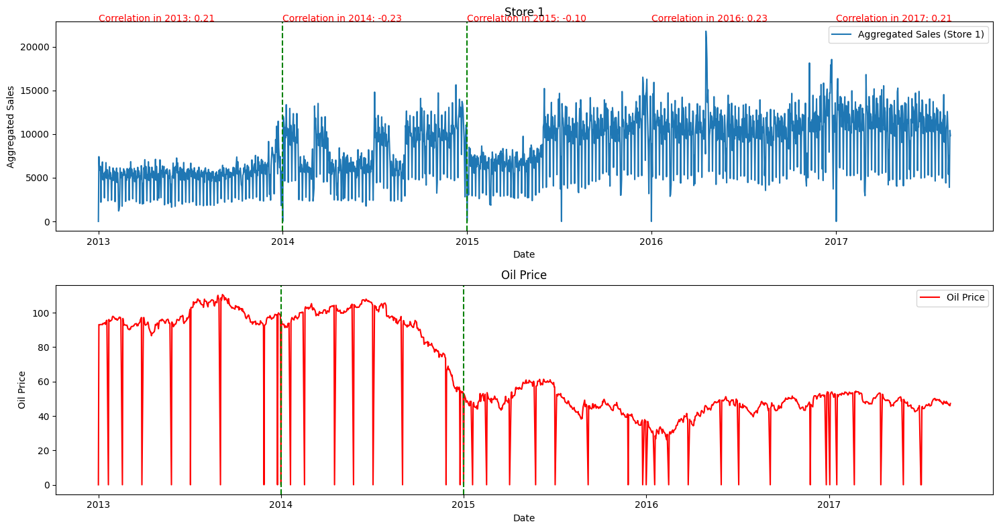

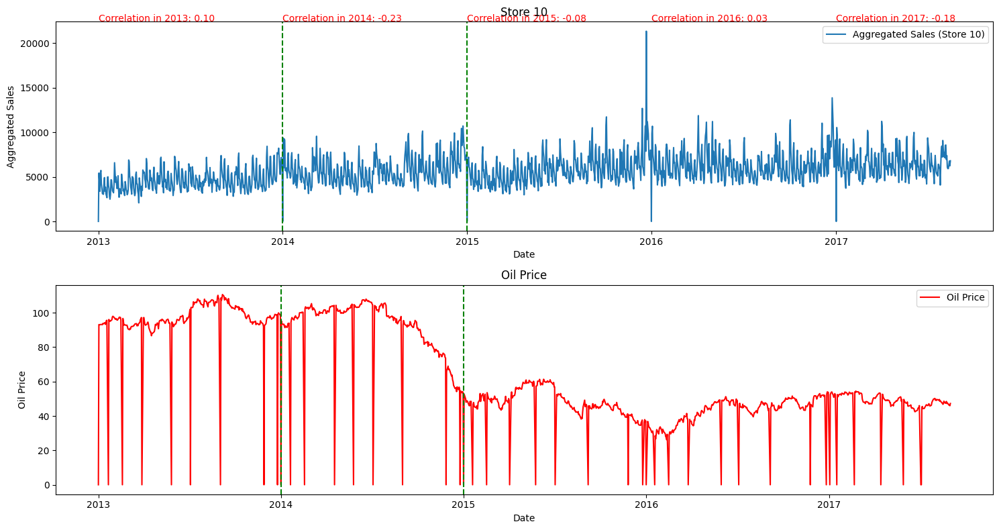

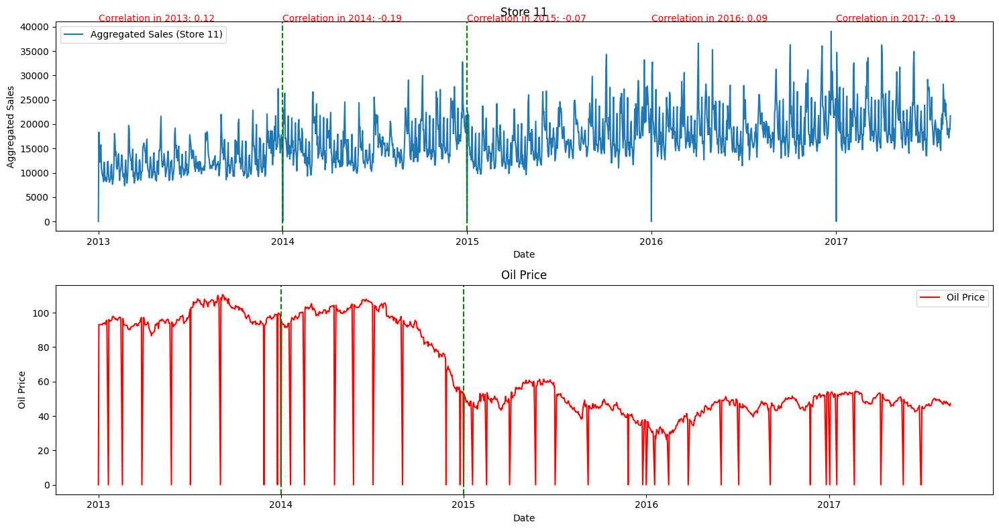

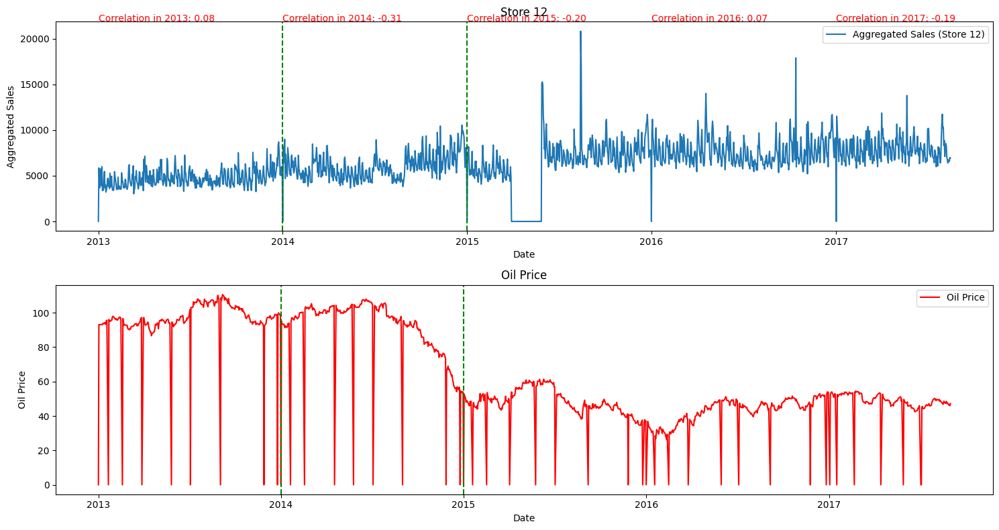

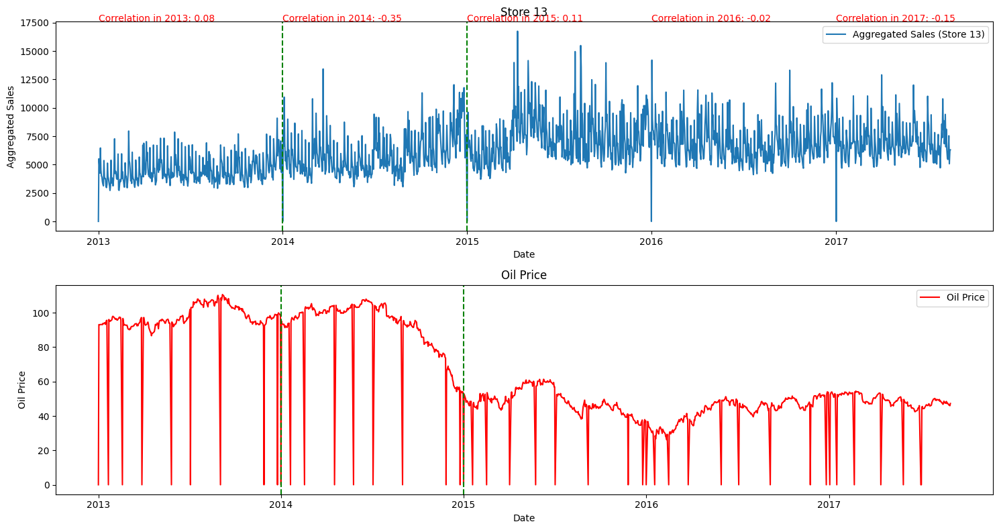

...

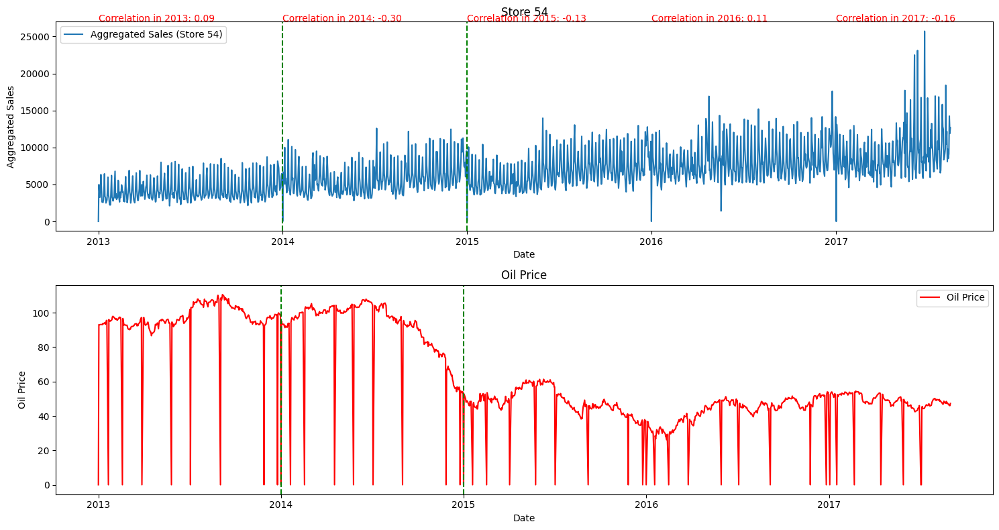

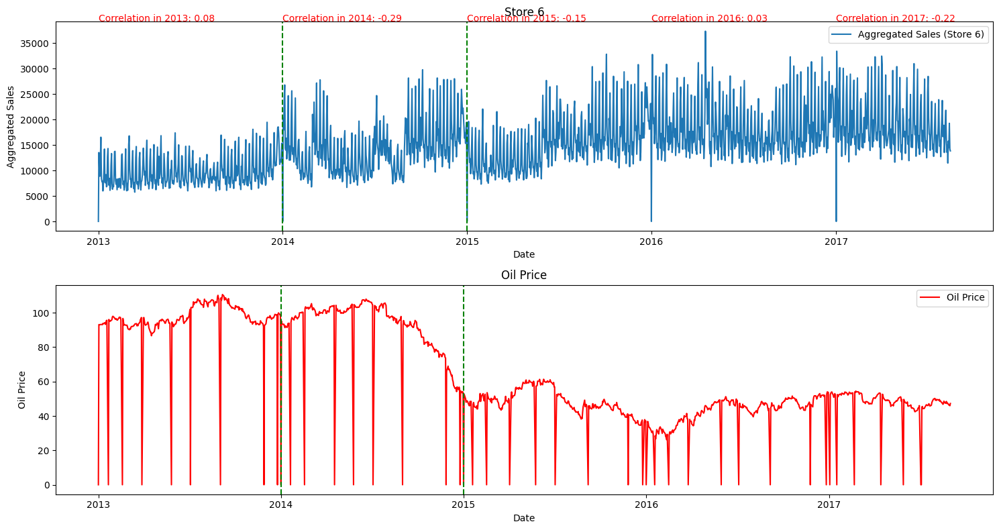

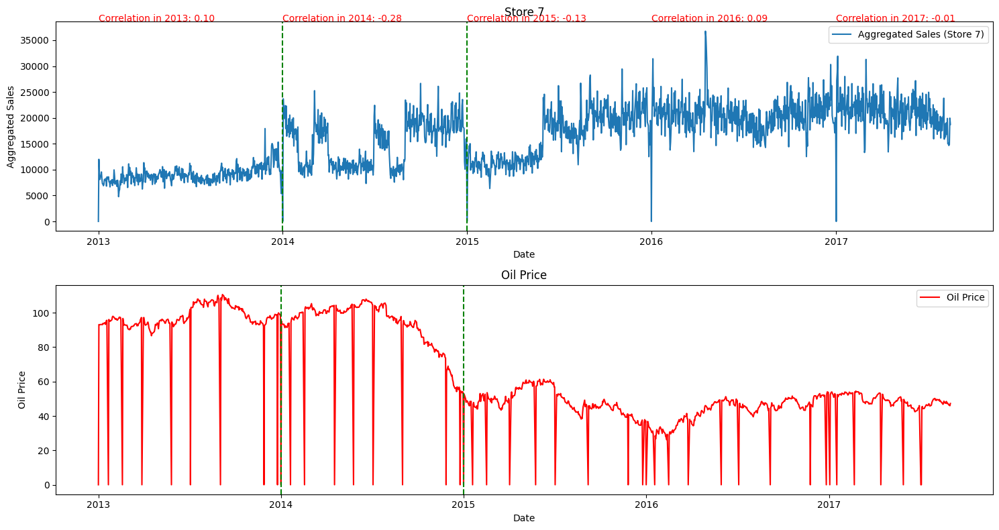

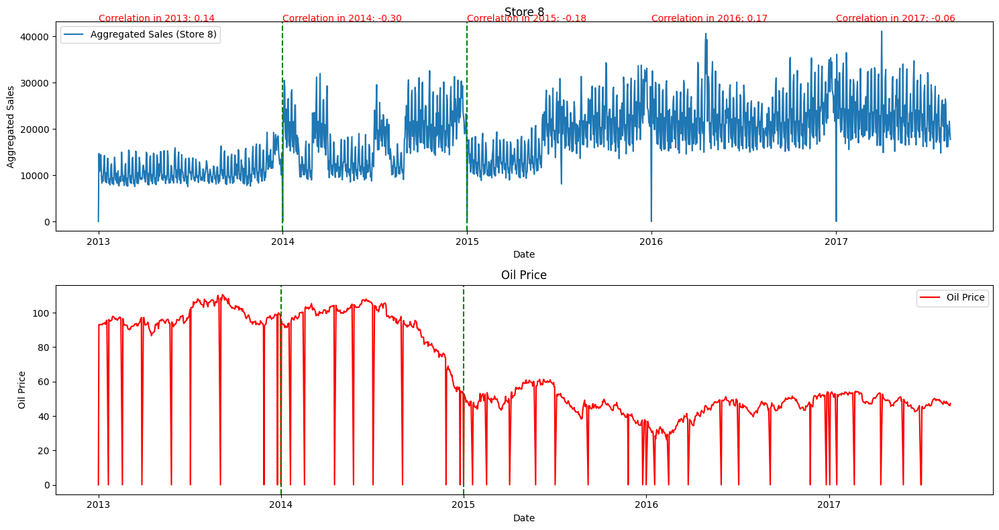

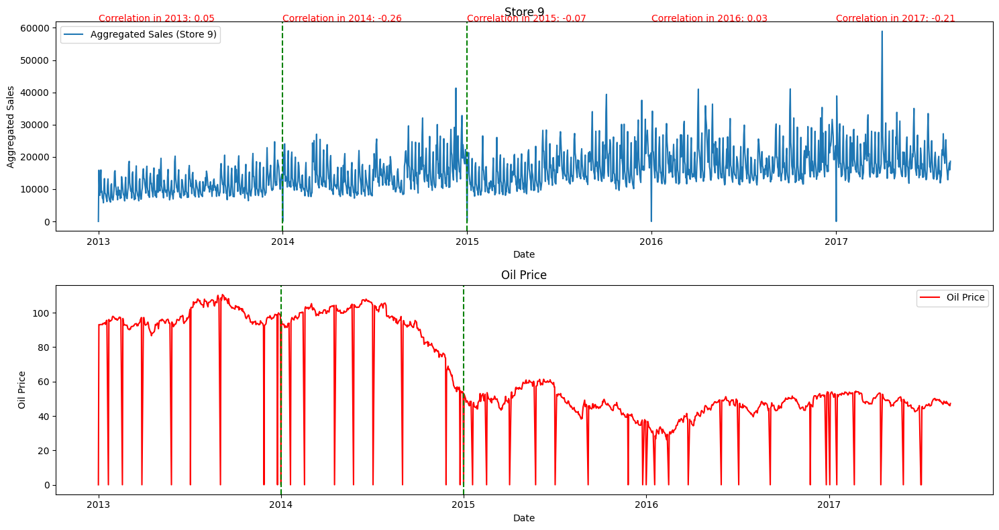

In [270]:
for store in stores:
    tmp_df = train_df[train_df['store_nbr'] == store][['date', 'agg_sales']].drop_duplicates()
    
    oil_df['date'] = pd.to_datetime(oil_df['date'], format="%Y-%m-%d")
  
    fig, axes = plt.subplots(2, 1, figsize=(15, 8))
    axes[0].plot(tmp_df['date'], tmp_df['agg_sales'], label='Aggregated Sales (Store ' + str(store) + ')')
    axes[0].set_title('Store ' + str(store))
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel('Aggregated Sales')
    axes[0].legend()

    axes[1].plot(oil_df['date'], oil_df['dcoilwtico'], label='Oil Price', color='Red')
    axes[1].set_title('Oil Price')
    axes[1].set_xlabel('Date')
    axes[1].set_ylabel('Oil Price')
    axes[1].legend()
    

    for ax in axes:
        ax.axvline(pd.to_datetime('2014-01-01'), color='g', linestyle='--')
        ax.axvline(pd.to_datetime('2015-01-01'), color='g', linestyle='--')
        
    # Print correlation values for each store in the corresponding plot
    for year in range(2013, 2018):
        if (year, store) in yearly_corr.index:
            correlation_value = yearly_corr.loc[(year, store)]
            axes[0].text(pd.Timestamp(str(year)), axes[0].get_ylim()[1], 
                         f'Correlation in {year}: {correlation_value:.2f}', color='red')
    
    plt.tight_layout()
    plt.show()


The correlations vary in magnitude, with some stores showing higher negative correlations with oil prices compared to others. For example, store 29 has a significant negative correlation of -0.2153, indicating a strong inverse relationship between its sales and oil prices.

Stores 21, 22, and 42 have particularly high negative correlations with oil prices, with coefficients of -0.2054, -0.1804, and -0.2165 respectively. This implies that changes in oil prices have a substantial impact on the sales performance of these stores.

On the other hand, stores like 16, 34, and 38 exhibit relatively lower negative correlations with oil prices, suggesting that their sales are less influenced by changes in oil prices compared to other stores.

Overall, the negative correlations provide insights into the potential impact of oil price fluctuations on store sales in Ecuador. Store owners and managers may need to monitor oil price trends and consider adjusting strategies to mitigate the effects of such correlations on their sales performance.


In [271]:
merged_df

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,dcoilwtico
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,1.409438,0.000,0.00
1,1,2013-01-01,1,BABY CARE,0.000,0,1.409438,0.000,0.00
2,2,2013-01-01,1,BEAUTY,0.000,0,1.409438,0.000,0.00
3,3,2013-01-01,1,BEVERAGES,0.000,0,1.409438,0.000,0.00
4,4,2013-01-01,1,BOOKS,0.000,0,1.409438,0.000,0.00
...,...,...,...,...,...,...,...,...,...
2143741,3000883,2017-08-15,9,POULTRY,438.133,0,427.980884,18636.477,47.57
2143742,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,427.980884,18636.477,47.57
2143743,3000885,2017-08-15,9,PRODUCE,2419.729,148,427.980884,18636.477,47.57
2143744,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,427.980884,18636.477,47.57


In [272]:
correlation_data = {}
for store in train_df['store_nbr'].unique():
    store_sales = merged_df[merged_df['store_nbr'] == store]['sales']
    oil_price = merged_df['dcoilwtico']
    correlation = store_sales.corr(oil_price)
    correlation_data[store] = correlation

print(correlation_data)

{1: -0.07270549092068257, 10: -0.03261334414508456, 11: -0.044284065232722845, 12: -0.0491411125846793, 13: -0.04911809117097193, 14: -0.050154431788060436, 15: -0.056313220060818965, 16: -0.019726773267192667, 17: -0.08833231550280862, 18: -0.05000961847495019, 19: -0.06481755124251397, 2: -0.06187538202449822, 20: -0.16624213937403928, 21: -0.2054442317775575, 22: -0.1804138617801922, 23: -0.05196215634888445, 24: -0.09348515476846532, 25: -0.07146882099680968, 26: -0.02977460423662641, 27: -0.09942691723165498, 28: -0.09175805214112226, 29: -0.21533085672159252, 3: -0.08499854430850107, 30: -0.07388719273322314, 31: -0.07672159658494462, 32: -0.04734265290126353, 33: -0.054097267126818956, 34: -0.03363700087921312, 35: -0.05862808803344437, 36: -0.10863833079973129, 37: -0.05458737193555504, 38: -0.052368570434590346, 39: -0.07568348884562244, 4: -0.07299978654867302, 40: -0.08984430494462603, 41: -0.10009240776819343, 42: -0.21646870899561169, 43: -0.06955801464244137, 44: -0.07145

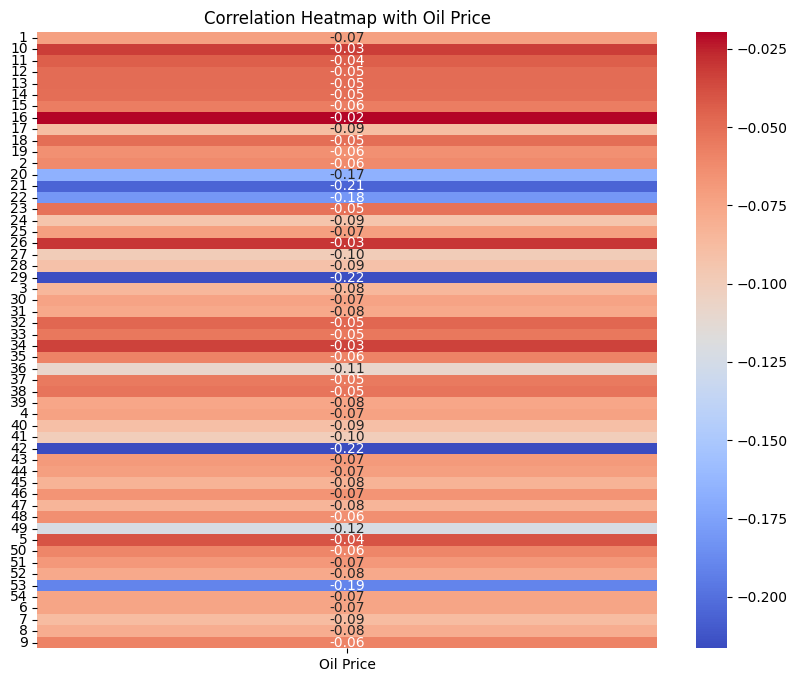

In [273]:
size = len(correlation_data)
correlation_matrix = np.zeros((size, 1))

for i, store in enumerate(correlation_data.keys()):
    correlation_matrix[i][0] = correlation_data.get(store)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", xticklabels=["Oil Price"], yticklabels=correlation_data.keys())
plt.title('Correlation Heatmap with Oil Price')
plt.show()

----------------------------------------------

The correlations vary with some stores showing higher negative correlations with oil prices compared to others

For example, store 29 has a significant negative correlation of -0.2153, indicating a strong inverse relationship between its sales and oil prices.

Stores 21, 22, and 42 have high negative correlations with oil prices, with coefficients of -0.2054, -0.1804, and -0.2165 respectively. 
This implies that changes in oil prices have a substantial impact on the sales performance of these stores.

On the other hand, stores like 16, 34, and 38 exhibit lower negative correlations with oil prices, suggesting that their sales are less influenced by changes in oil prices compared to other stores.


----------------------------------------

By considering the low correlation between the oil price and most of the stores time series, it seems that there are not many important relationship between them. Thereare not many lossed information due to the lack of oil price data during the training the machine learning models to forecast the future behaviors of the time series.

-------------------------

6-Is every day represented, such as whether the sales in stores on Sundays are 0 or not included in the dataset?
\begin{equation}
    \forall s \in \mathcal{S}, \forall p \in \mathcal{P}, H(s)=\{t \mid \forall t \in \mathcal{T}, X_{sp}^{t}=0\} 
    % \forall 1 \leq i \leq n \wedge 1 \leq j \leq m, C(i) = \{t \mid 0 \leq t \leq T , X_{t}^{ij} = 0\}
\end{equation}
or 
\begin{equation}
   \forall s \in \mathcal{S}, \forall p \in \mathcal{P}, H(s)=\{t \mid \forall t \in \mathcal{T}, X_{sp}^{t}=NaN\} 
    %\forall 1 \leq i \leq n \wedge 1 \leq j \leq m, C(i) = {t \mid 0 \leq t \leq T , X_{t}^{ij} = NaN}
\end{equation}

In [274]:
date_range = pd.date_range(train_df['date'].min(), train_df['date'].max())

In [275]:
missing_values = train_df[train_df['sales'].isnull()]

In [276]:
if missing_values.empty:
    print("No missing values found.")
else:
    print("Missing values found.")
    print(missing_values)

No missing values found.


In [277]:
zero_sales_days = train_df.loc[train_df['sales'] == 0, :]

In [278]:
zero_sales_days

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,1.409438,0.000
1,1,2013-01-01,1,BABY CARE,0.0,0,1.409438,0.000
2,2,2013-01-01,1,BEAUTY,0.0,0,1.409438,0.000
3,3,2013-01-01,1,BEVERAGES,0.0,0,1.409438,0.000
4,4,2013-01-01,1,BOOKS,0.0,0,1.409438,0.000
...,...,...,...,...,...,...,...,...
3000839,3000839,2017-08-15,8,HOME APPLIANCES,0.0,0,427.980884,17723.876
3000853,3000853,2017-08-15,8,SCHOOL AND OFFICE SUPPLIES,0.0,0,427.980884,17723.876
3000856,3000856,2017-08-15,9,BABY CARE,0.0,0,427.980884,18636.477
3000859,3000859,2017-08-15,9,BOOKS,0.0,0,427.980884,18636.477


In [279]:
zero_sales_days.loc[:, 'date'] = pd.to_datetime(zero_sales_days['date'], format="%Y-%m-%d")

In [280]:
#zero_sales_families = zero_sales_days.groupby(['store_nbr', 'family']).apply(lambda x: (x['sales'] == 0).all())

In [281]:
#zero_sales_families = pd.DataFrame(zero_sales_families)

In [282]:
#zero_sales_families.head(35)

In [283]:
zero_sales_days

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,1.409438,0.000
1,1,2013-01-01,1,BABY CARE,0.0,0,1.409438,0.000
2,2,2013-01-01,1,BEAUTY,0.0,0,1.409438,0.000
3,3,2013-01-01,1,BEVERAGES,0.0,0,1.409438,0.000
4,4,2013-01-01,1,BOOKS,0.0,0,1.409438,0.000
...,...,...,...,...,...,...,...,...
3000839,3000839,2017-08-15,8,HOME APPLIANCES,0.0,0,427.980884,17723.876
3000853,3000853,2017-08-15,8,SCHOOL AND OFFICE SUPPLIES,0.0,0,427.980884,17723.876
3000856,3000856,2017-08-15,9,BABY CARE,0.0,0,427.980884,18636.477
3000859,3000859,2017-08-15,9,BOOKS,0.0,0,427.980884,18636.477


In [284]:
dates_stores_with_zero_sales = zero_sales_days.groupby(['date', 'store_nbr']).apply(lambda x: (x['sales'] == 0).all())

/tmp/ipykernel_11543/4258770860.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dates_stores_with_zero_sales = zero_sales_days.groupby(['date', 'store_nbr']).apply(lambda x: (x['sales'] == 0).all())


In [285]:
dates_stores_with_zero_sales

date        store_nbr
2013-01-01  1            True
            2            True
            3            True
            4            True
            5            True
                         ... 
2017-08-15  50           True
            51           True
            52           True
            53           True
            54           True
Length: 90826, dtype: bool

In [286]:
dates_stores_with_zero_sales = pd.DataFrame(dates_stores_with_zero_sales)

In [287]:
dates_stores_with_zero_sales

0
date       store_nbr      
2013-01-01 1          True
           2          True
           3          True
           4          True
           5          True
...                    ...
2017-08-15 50         True
           51         True
           52         True
           53         True
           54         True

[90826 rows x 1 columns]

Sales in stores are consistently represented for the days across the dataset. Each date from "2013-01-01" to "2017-08-15" is included, and sales data is available for almost all days within this time frame. It is essencial to mention that the 0 values related to the dates befor opening several shops has been deleted. Therefore, the corrent 0 values in the dataset, are related to the dates that the shop temporarily was closed due to renovation, or something like it!

7- Is there any specific group of products that can justify peaks in the store 35's time series?

In [288]:
store_35 = train_df[train_df['store_nbr']==35]

In [289]:
store_35.tail(40)

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
2998274,2998274,2017-08-14,35,PET SUPPLIES,0.00000,0,427.004717,4934.36698
2998275,2998275,2017-08-14,35,PLAYERS AND ELECTRONICS,0.00000,0,427.004717,4934.36698
2998276,2998276,2017-08-14,35,POULTRY,33.26800,0,427.004717,4934.36698
2998277,2998277,2017-08-14,35,PREPARED FOODS,12.00000,0,427.004717,4934.36698
2998278,2998278,2017-08-14,35,PRODUCE,344.70898,1,427.004717,4934.36698
2998279,2998279,2017-08-14,35,SCHOOL AND OFFICE SUPPLIES,0.00000,0,427.004717,4934.36698
2998280,2998280,2017-08-14,35,SEAFOOD,2.00000,0,427.004717,4934.36698
3000030,3000030,2017-08-15,35,AUTOMOTIVE,5.00000,0,427.980884,5371.15600
3000031,3000031,2017-08-15,35,BABY CARE,0.00000,0,427.980884,5371.15600
3000032,3000032,2017-08-15,35,BEAUTY,1.00000,1,427.980884,5371.15600


In [290]:
store_35_daily_sales = store_35.groupby(['date', 'family']).sum()

In [291]:
store_35['agg_sales']

924           0.000
925           0.000
926           0.000
927           0.000
928           0.000
             ...   
3000058    5371.156
3000059    5371.156
3000060    5371.156
3000061    5371.156
3000062    5371.156
Name: agg_sales, Length: 55572, dtype: float64

In [292]:
store_35_reset = store_35.reset_index()

In [293]:
store_35_peaks,_ = signal.find_peaks(store_35['agg_sales'], height=20000)

In [294]:
store_35_peaks

array([23281, 35491, 47470])

In [295]:
agg_sales_peaks = store_35[['date','agg_sales']].iloc[store_35_peaks]

In [296]:
agg_sales_peaks

,date,agg_sales
1257250,2014-12-08,50977.86099
1916590,2015-12-14,45574.54600
2563456,2016-12-12,36463.25400


In [297]:
first = train_df[train_df['agg_sales']==50977.86099]

Filter the DataFrame based on 'agg_sales' value with tolerance

In [298]:
tolerance = 0.0001 

first_sales_rows = train_df[(train_df['agg_sales'] >= 50977.8609 - tolerance) & (train_df['agg_sales'] <= 50977.8609 + tolerance)]

first_sales_rows


,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
1257234,1257234,2014-12-08,35,AUTOMOTIVE,2.00000,0,443.481083,50977.86099
1257235,1257235,2014-12-08,35,BABY CARE,0.00000,0,443.481083,50977.86099
1257236,1257236,2014-12-08,35,BEAUTY,0.00000,0,443.481083,50977.86099
1257237,1257237,2014-12-08,35,BEVERAGES,3823.00000,0,443.481083,50977.86099
1257238,1257238,2014-12-08,35,BOOKS,0.00000,0,443.481083,50977.86099
1257239,1257239,2014-12-08,35,BREAD/BAKERY,98.00000,0,443.481083,50977.86099
1257240,1257240,2014-12-08,35,CELEBRATION,1.00000,0,443.481083,50977.86099
1257241,1257241,2014-12-08,35,CLEANING,548.00000,5,443.481083,50977.86099
1257242,1257242,2014-12-08,35,DAIRY,160.00000,0,443.481083,50977.86099
1257243,1257243,2014-12-08,35,DELI,137.00000,0,443.481083,50977.86099


In [299]:
second = train_df[train_df['agg_sales']==45574.54600]

Filter the DataFrame based on 'agg_sales' value with tolerance

In [300]:
tolerance = 0.0001


second_sales_rows = train_df[(train_df['agg_sales'] >= 45574.54600 - tolerance) & (train_df['agg_sales'] <= 45574.54600 + tolerance)]

second_sales_rows

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
1916574,1916574,2015-12-14,35,AUTOMOTIVE,7.000,0,455.451023,45574.546
1916575,1916575,2015-12-14,35,BABY CARE,0.000,0,455.451023,45574.546
1916576,1916576,2015-12-14,35,BEAUTY,0.000,0,455.451023,45574.546
1916577,1916577,2015-12-14,35,BEVERAGES,3673.000,6,455.451023,45574.546
1916578,1916578,2015-12-14,35,BOOKS,0.000,0,455.451023,45574.546
1916579,1916579,2015-12-14,35,BREAD/BAKERY,44.000,0,455.451023,45574.546
1916580,1916580,2015-12-14,35,CELEBRATION,0.000,0,455.451023,45574.546
1916581,1916581,2015-12-14,35,CLEANING,454.000,6,455.451023,45574.546
1916582,1916582,2015-12-14,35,DAIRY,156.000,1,455.451023,45574.546
1916583,1916583,2015-12-14,35,DELI,104.000,0,455.451023,45574.546


In [301]:
third = train_df[train_df['agg_sales']==36463.25400]

Filter the DataFrame based on 'agg_sales' value with tolerance

In [302]:
tolerance = 0.0001 

third_sales_rows = train_df[(train_df['agg_sales'] >= 36463.25400 - tolerance) & (train_df['agg_sales'] <= 36463.25400 + tolerance)]

third_sales_rows

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales
2563440,2563440,2016-12-12,35,AUTOMOTIVE,3.000,0,473.766388,36463.254
2563441,2563441,2016-12-12,35,BABY CARE,0.000,0,473.766388,36463.254
2563442,2563442,2016-12-12,35,BEAUTY,0.000,0,473.766388,36463.254
2563443,2563443,2016-12-12,35,BEVERAGES,3370.000,35,473.766388,36463.254
2563444,2563444,2016-12-12,35,BOOKS,0.000,0,473.766388,36463.254
2563445,2563445,2016-12-12,35,BREAD/BAKERY,73.000,1,473.766388,36463.254
2563446,2563446,2016-12-12,35,CELEBRATION,0.000,0,473.766388,36463.254
2563447,2563447,2016-12-12,35,CLEANING,401.000,15,473.766388,36463.254
2563448,2563448,2016-12-12,35,DAIRY,229.000,12,473.766388,36463.254
2563449,2563449,2016-12-12,35,DELI,87.000,4,473.766388,36463.254


The aggregation sales of the first, second, and third peak at 2014, 2015, and 2016 of the date of store 35 are equal to 50977.86099, 45574.54600, and 36463.25400 which the biggest sales value for all of them are related to the GROCERY I, BEVERAGES, and CLEANING, respectively.

In [303]:
#stores = train_df['store_nbr'].drop_duplicates().values

In [304]:
#def yearly_correlation(data):
#    yearly_correlation = data.groupby([data['date'].dt.year, 'store_nbr']) \
#                             .apply(lambda x: x['agg_sales'].corr(x['dcoilwtico']))
#    return yearly_correlation

In [305]:
#merged_df = train_df.merge(oil_df, on='date', how='inner')

In [306]:
#merged_df = merged_df.dropna(subset=['agg_sales', 'dcoilwtico'])

In [307]:
#yearly_corr = yearly_correlation(merged_df)

In [308]:
#print(yearly_corr)

In [309]:
#for year in yearly_corr.index.levels[0]:
#    print(f"Data for year {year}:")
#    year_data = yearly_corr.loc[year]
#    print(year_data)

In [310]:
train_df['year'] = train_df['date'].dt.year

In [311]:
train_df[train_df['year']==2014]

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
648648,648648,2014-01-01,1,AUTOMOTIVE,0.000,0,4.827197,0.000,2014
648649,648649,2014-01-01,1,BABY CARE,0.000,0,4.827197,0.000,2014
648650,648650,2014-01-01,1,BEAUTY,0.000,0,4.827197,0.000,2014
648651,648651,2014-01-01,1,BEVERAGES,0.000,0,4.827197,0.000,2014
648652,648652,2014-01-01,1,BOOKS,0.000,0,4.827197,0.000,2014
...,...,...,...,...,...,...,...,...,...
1297291,1297291,2014-12-31,9,POULTRY,589.104,3,473.838647,17479.421,2014
1297292,1297292,2014-12-31,9,PREPARED FOODS,68.000,0,473.838647,17479.421,2014
1297293,1297293,2014-12-31,9,PRODUCE,2086.514,0,473.838647,17479.421,2014
1297294,1297294,2014-12-31,9,SCHOOL AND OFFICE SUPPLIES,2.000,0,473.838647,17479.421,2014


In [312]:
train_df.groupby(['store_nbr', 'year'])['agg_sales'].sum()

store_nbr  year
1          2013    6.252551e+07
           2014    9.569041e+07
           2015    1.029791e+08
           2016    1.251853e+08
           2017    8.040510e+07
                       ...     
54         2013    5.050031e+07
           2014    6.903994e+07
           2015    7.990567e+07
           2016    9.716321e+07
           2017    6.828781e+07
Name: agg_sales, Length: 270, dtype: float64

In [313]:
agg_sales_by_year_store = train_df.groupby(['store_nbr', 'year'])['agg_sales'].sum().unstack()

In [314]:
agg_sales_by_year_store

year,2013,2014,2015,2016,2017
store_nbr,,,,,
1,6.252551e+07,9.569041e+07,1.029791e+08,1.251853e+08,8.040510e+07
2,9.455798e+07,1.460618e+08,1.588964e+08,1.942384e+08,1.176392e+08
3,2.132678e+08,3.396083e+08,3.751843e+08,4.503354e+08,2.875072e+08
4,8.619541e+07,1.318306e+08,1.380737e+08,1.647480e+08,1.031724e+08
5,8.511883e+07,1.190851e+08,1.160987e+08,1.187429e+08,7.550387e+07
6,1.170311e+08,1.721271e+08,1.829428e+08,2.189665e+08,1.399939e+08
7,1.083494e+08,1.800273e+08,1.952244e+08,2.481439e+08,1.576727e+08
8,1.319262e+08,2.096906e+08,2.209581e+08,2.704599e+08,1.732767e+08
9,1.328862e+08,1.769742e+08,1.929456e+08,2.242105e+08,1.444951e+08


In [315]:
for store, sales in agg_sales_by_year_store.iterrows():
    average_sales_2014 = sales.loc[2014].mean()
    average_sales_other_years = sales.loc[~sales.index.isin([2014])].mean()
    
    print(f"Store_nbr {store}:")
    print(f"    Average sales for 2014-2015: {average_sales_2014}")
    print(f"    Average sales for other years: {average_sales_other_years}")

    if average_sales_2014 > average_sales_other_years:
        print("    Conclusion: The average sales in 2014 seemd to be higher compared to other years.\n")
    else:
        print("    Conclusion: The average sales in 2014 do not significantly differ from other years.\n")


Store_nbr 1:
    Average sales for 2014-2015: 95690414.1234723
    Average sales for other years: 92773752.64377825
    Conclusion: The average sales in 2014 seemd to be higher compared to other years.

Store_nbr 2:
    Average sales for 2014-2015: 146061832.712037
    Average sales for other years: 141332998.1396454
    Conclusion: The average sales in 2014 seemd to be higher compared to other years.

Store_nbr 3:
    Average sales for 2014-2015: 339608251.67181
    Average sales for other years: 331573696.108974
    Conclusion: The average sales in 2014 seemd to be higher compared to other years.

Store_nbr 4:
    Average sales for 2014-2015: 131830576.3588935
    Average sales for other years: 123047384.04528487
    Conclusion: The average sales in 2014 seemd to be higher compared to other years.

Store_nbr 5:
    Average sales for 2014-2015: 119085059.9910015
    Average sales for other years: 98866072.72416352
    Conclusion: The average sales in 2014 seemd to be higher compared t

12- Checking the peak between 2016 to 2017 for the stores 27, 28, and 29.

In [316]:
store_27 = train_df[train_df['store_nbr']==27]

In [317]:
store_27

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
627,627,2013-01-01,27,AUTOMOTIVE,0.000,0,1.409438,0.000,2013
628,628,2013-01-01,27,BABY CARE,0.000,0,1.409438,0.000,2013
629,629,2013-01-01,27,BEAUTY,0.000,0,1.409438,0.000,2013
630,630,2013-01-01,27,BEVERAGES,0.000,0,1.409438,0.000,2013
631,631,2013-01-01,27,BOOKS,0.000,0,1.409438,0.000,2013
...,...,...,...,...,...,...,...,...,...
2999761,2999761,2017-08-15,27,POULTRY,382.930,0,427.980884,13377.979,2017
2999762,2999762,2017-08-15,27,PREPARED FOODS,89.543,0,427.980884,13377.979,2017
2999763,2999763,2017-08-15,27,PRODUCE,2258.659,8,427.980884,13377.979,2017
2999764,2999764,2017-08-15,27,SCHOOL AND OFFICE SUPPLIES,0.000,0,427.980884,13377.979,2017


In [318]:
store_27_daily_sales = store_27.groupby(['date', 'family']).sum()

In [319]:
store_27_daily_sales

id  store_nbr     sales  \
date       family                                                     
2013-01-01 AUTOMOTIVE                      627         27     0.000   
           BABY CARE                       628         27     0.000   
           BEAUTY                          629         27     0.000   
           BEVERAGES                       630         27     0.000   
           BOOKS                           631         27     0.000   
...                                        ...        ...       ...   
2017-08-15 POULTRY                     2999761         27   382.930   
           PREPARED FOODS              2999762         27    89.543   
           PRODUCE                     2999763         27  2258.659   
           SCHOOL AND OFFICE SUPPLIES  2999764         27     0.000   
           SEAFOOD                     2999765         27    19.214   

                                       onpromotion  mean_sales  agg_sales  \
date       family                                                           
2013-01-01 AUTOMOTIVE                            0    1.409438      0.000   
           BABY CARE                             0    1.409438      0.000   
           BEAUTY                                0    1.409438      0.000   
           BEVERAGES                             0    1.409438      0.000   
           BOOKS                                 0    1.409438      0.000   
...                                            ...         ...        ...   
2017-08-15 POULTRY                               0  427.980884  13377.979   
           PREPARED FOODS                        0  427.980884  13377.979   
           PRODUCE                               8  427.980884  13377.979   
           SCHOOL AND OFFICE SUPPLIES            0  427.980884  13377.979   
           SEAFOOD                               0  427.980884  13377.979   

                                       year  
date       family                            
2013-01-01 AUTOMOTIVE                  2013  
           BABY CARE                   2013  
           BEAUTY                      2013  
           BEVERAGES                   2013  
           BOOKS                       2013  
...                                     ...  
2017-08-15 POULTRY                     2017  
           PREPARED FOODS              2017  
           PRODUCE                     2017  
           SCHOOL AND OFFICE SUPPLIES  2017  
           SEAFOOD                     2017  

[55572 rows x 7 columns]

In [320]:
store_27['agg_sales']

627            0.000
628            0.000
629            0.000
630            0.000
631            0.000
             ...    
2999761    13377.979
2999762    13377.979
2999763    13377.979
2999764    13377.979
2999765    13377.979
Name: agg_sales, Length: 55572, dtype: float64

In [321]:
store_27_reset = store_27.reset_index()

In [322]:
store_27_peaks,_ = signal.find_peaks(store_27['agg_sales'], height=26000)

In [323]:
store_27_peaks

array([39583])

In [324]:
agg_sales_peaks = store_27[['date','agg_sales']].iloc[store_27_peaks]

In [325]:
agg_sales_peaks

,date,agg_sales
2137261,2016-04-17,40102.02301


In [326]:
peak_27 = train_df[train_df['agg_sales']==40102.02301]

In [327]:
store_27

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
627,627,2013-01-01,27,AUTOMOTIVE,0.000,0,1.409438,0.000,2013
628,628,2013-01-01,27,BABY CARE,0.000,0,1.409438,0.000,2013
629,629,2013-01-01,27,BEAUTY,0.000,0,1.409438,0.000,2013
630,630,2013-01-01,27,BEVERAGES,0.000,0,1.409438,0.000,2013
631,631,2013-01-01,27,BOOKS,0.000,0,1.409438,0.000,2013
...,...,...,...,...,...,...,...,...,...
2999761,2999761,2017-08-15,27,POULTRY,382.930,0,427.980884,13377.979,2017
2999762,2999762,2017-08-15,27,PREPARED FOODS,89.543,0,427.980884,13377.979,2017
2999763,2999763,2017-08-15,27,PRODUCE,2258.659,8,427.980884,13377.979,2017
2999764,2999764,2017-08-15,27,SCHOOL AND OFFICE SUPPLIES,0.000,0,427.980884,13377.979,2017


In [328]:
tolerance = 0.0001  


store_27_peak_rows = train_df[(train_df['agg_sales'] >= 40102.02301 - tolerance) & (train_df['agg_sales'] <= 40102.02301 + tolerance)]


store_27_peak_rows

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
2137245,2137245,2016-04-17,27,AUTOMOTIVE,16.00000,0,713.711414,40102.02301,2016
2137246,2137246,2016-04-17,27,BABY CARE,0.00000,0,713.711414,40102.02301,2016
2137247,2137247,2016-04-17,27,BEAUTY,12.00000,0,713.711414,40102.02301,2016
2137248,2137248,2016-04-17,27,BEVERAGES,8495.00000,25,713.711414,40102.02301,2016
2137249,2137249,2016-04-17,27,BOOKS,0.00000,0,713.711414,40102.02301,2016
2137250,2137250,2016-04-17,27,BREAD/BAKERY,1505.86500,1,713.711414,40102.02301,2016
2137251,2137251,2016-04-17,27,CELEBRATION,15.00000,0,713.711414,40102.02301,2016
2137252,2137252,2016-04-17,27,CLEANING,2056.00000,8,713.711414,40102.02301,2016
2137253,2137253,2016-04-17,27,DAIRY,2360.00000,1,713.711414,40102.02301,2016
2137254,2137254,2016-04-17,27,DELI,511.80300,0,713.711414,40102.02301,2016


By considering the values of sales in the data of the store number 27, the most family products that effects the peak between 2016 to 2017 are GROCERY |, BEVERAGES, and PRODUCE

In [329]:
store_28 = train_df[train_df['store_nbr']==28]

store_28_daily_sales = store_28.groupby(['date', 'family']).sum()
store_28_reset = store_28.reset_index()
store_28_peaks,_ = signal.find_peaks(store_28['agg_sales'], height=35000)
print('Peak indexes:', store_28_peaks,'\n')
agg_sales_peaks = store_28[['date','agg_sales']].iloc[store_28_peaks]
print('Peak aggregation sales value:\n', agg_sales_peaks,'\n')

Peak indexes: [39583] 

Peak aggregation sales value:
               date     agg_sales
2137294 2016-04-17  36743.614005 



In [330]:
store_28 = train_df[train_df['agg_sales']==36743.614005]
tolerance = 0.0001  

store_28_peak_rows = train_df[(train_df['agg_sales'] >= 36743.614005 - tolerance) & (train_df['agg_sales'] <= 36743.614005 + tolerance)]


store_28_peak_rows

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
2137278,2137278,2016-04-17,28,AUTOMOTIVE,10.000000,0,713.711414,36743.614005,2016
2137279,2137279,2016-04-17,28,BABY CARE,0.000000,0,713.711414,36743.614005,2016
2137280,2137280,2016-04-17,28,BEAUTY,8.000000,0,713.711414,36743.614005,2016
2137281,2137281,2016-04-17,28,BEVERAGES,8448.000000,40,713.711414,36743.614005,2016
2137282,2137282,2016-04-17,28,BOOKS,0.000000,0,713.711414,36743.614005,2016
2137283,2137283,2016-04-17,28,BREAD/BAKERY,1243.000000,77,713.711414,36743.614005,2016
2137284,2137284,2016-04-17,28,CELEBRATION,12.000000,0,713.711414,36743.614005,2016
2137285,2137285,2016-04-17,28,CLEANING,2811.000000,5,713.711414,36743.614005,2016
2137286,2137286,2016-04-17,28,DAIRY,1830.000000,14,713.711414,36743.614005,2016
2137287,2137287,2016-04-17,28,DELI,879.537000,0,713.711414,36743.614005,2016


By considering the values of sales in the data of the store number 28, the most family products that effects the peak between 2016 to 2017 are GROCERY |, BEVERAGES, and PRODUCE

In [331]:
store_29 = train_df[train_df['store_nbr']==29]

store_29_daily_sales = store_29.groupby(['date', 'family']).sum()
store_29_reset = store_29.reset_index()
store_29_peaks,_ = signal.find_peaks(store_29['agg_sales'], height=30000)
print('Peak indexes:', store_29_peaks,'\n')
agg_sales_peaks = store_29[['date','agg_sales']].iloc[store_29_peaks]
print('Peak aggregation sales value:\n', agg_sales_peaks,'\n')

Peak indexes: [39616] 

Peak aggregation sales value:
               date  agg_sales
2139109 2016-04-18  31367.553 



Filter the DataFrame based on 'agg_sales' value with tolerance

In [332]:
store_29 = train_df[train_df['agg_sales']==31367.553]
tolerance = 0.0001  


store_29_peak_rows = train_df[(train_df['agg_sales'] >= 31367.553 - tolerance) & (train_df['agg_sales'] <= 31367.553 + tolerance)]


store_29_peak_rows

,id,date,store_nbr,family,sales,onpromotion,mean_sales,agg_sales,year
2139093,2139093,2016-04-18,29,AUTOMOTIVE,2.000,0,755.286535,31367.553,2016
2139094,2139094,2016-04-18,29,BABY CARE,1.000,0,755.286535,31367.553,2016
2139095,2139095,2016-04-18,29,BEAUTY,6.000,0,755.286535,31367.553,2016
2139096,2139096,2016-04-18,29,BEVERAGES,8255.000,33,755.286535,31367.553,2016
2139097,2139097,2016-04-18,29,BOOKS,0.000,0,755.286535,31367.553,2016
2139098,2139098,2016-04-18,29,BREAD/BAKERY,784.000,1,755.286535,31367.553,2016
2139099,2139099,2016-04-18,29,CELEBRATION,3.000,0,755.286535,31367.553,2016
2139100,2139100,2016-04-18,29,CLEANING,2274.000,3,755.286535,31367.553,2016
2139101,2139101,2016-04-18,29,DAIRY,787.000,9,755.286535,31367.553,2016
2139102,2139102,2016-04-18,29,DELI,312.612,1,755.286535,31367.553,2016


By considering the values of sales in the data of the store number 29, the most family products that effects the peak between 2016 to 2017 are GROCERY |, BEVERAGES, and CLEANING

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------

There are several peaks in the data of the stores 35, 27, 28, and 29. in the following, we will examine if there is any specific holiday or events in these dates

Dates of peaks and aggregation sales for the store 35:


 	2014-12-08 	50977.86099
	2015-12-14 	45574.54600
	2016-12-12 	36463.25400

Dates of peaks and aggregation sales for the store 27:


 	2016-04-17 	40102.02301

Dates of peaks and aggregation sales for the store 28:


     2016-04-17  36743.614005

Dates of peaks and aggregation sales for the store 29:

    2016-04-18  31367.553 

In [333]:
holidays_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/holidays_events.csv')

In [334]:
def check_holiday(date):
    holiday_info = holidays_df[holidays_df['date'] == date]
    if not holiday_info.empty:
        print(f"The date {date} is a holiday in Ecuador.")
        print(holiday_info)
    else:
        print(f"The date {date} is not a holiday in Ecuador.")

In [335]:
dates_to_check = ['2014-12-08', '2015-12-14', '2016-12-12', '2016-04-17', '2016-04-18']

In [336]:
for date in dates_to_check:
    check_holiday(date)

The date 2014-12-08 is a holiday in Ecuador.
           date     type locale locale_name        description  transferred
148  2014-12-08  Holiday  Local        Loja  Fundacion de Loja        False
The date 2015-12-14 is not a holiday in Ecuador.
The date 2016-12-12 is not a holiday in Ecuador.
The date 2016-04-17 is a holiday in Ecuador.
           date   type    locale locale_name         description  transferred
220  2016-04-17  Event  National     Ecuador  Terremoto Manabi+1        False
The date 2016-04-18 is a holiday in Ecuador.
           date   type    locale locale_name         description  transferred
221  2016-04-18  Event  National     Ecuador  Terremoto Manabi+2        False


--------------------------------------------------------------------------------------------------------------------

---------------------------------------------------------------------------------------------------

Note: Fundación de Loja is a nonprofit organization in Loja, Ecuador, dedicated to community-centric initiatives. It engages in social, cultural, educational, and charitable endeavors to benefit Loja and potentially wider areas. Nonprofits like Fundación de Loja typically tackle social issues, aid local development, offer education, foster arts and culture, and provide humanitarian assistance. For more information on Fundación de Loja's mission and activities, one can refer to their official website or local sources.

In [337]:
store_df = pd.read_csv('/home/nnemati/forcasting_time_series/kaggle_chalenge/sale_forcasting_chalenge/data/raw/stores.csv')

In [338]:
store_numbers = [35, 27, 28, 29]

In [339]:
filtered_stores = store_df[store_df['store_nbr'].isin(store_numbers)]

In [340]:
filtered_stores

,store_nbr,city,state,type,cluster
26,27,Daule,Guayas,D,1
27,28,Guayaquil,Guayas,E,10
28,29,Guayaquil,Guayas,E,10
34,35,Playas,Guayas,C,3


In [341]:
store_df

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


##### 2014-12-08 is holiday. it is related to the Fundacion de Loja. However, store 35 locates in Playas, and it is not related to Loja.
##### Therefore, this holiday does not effects on this store.

##### Because of the earthquake in 2016-04-16, a couple of days after that, 2016-04-17 and 2016-04-18 was national holiday in Ecuador. This was the biggest erthquake in Ecuador, 7.8 Mw that felt in many cities such as capital city of Quito, Esmeraldas, Guayaquil, Manta, Pendernalen, and Cali.

##### Many of the stores, such as stores 27, 28, and 29 stores in the dataset are located in Quito, Esmeraldas, Guayaquil, and Manta.